# Introduction to Deep Learning

<div style="text-align: right">   </div>


Introduction to Deep Learning (2024) &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;&nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;&nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;&nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;&nbsp; &nbsp; &nbsp; &nbsp; &nbsp; &nbsp;| &nbsp;
-------|-------------------
**Assignment 1, Part 3: Generative Models** | <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/UniversiteitLeidenLogo.svg/1280px-UniversiteitLeidenLogo.svg.png" width="300">


In this notebook we are going to cover two generative models for generating novel images:

1. Variational Autoencoders (**VAEs**)
2. Generative adversarial networks (**GANs**)


<img src="https://lilianweng.github.io/lil-log/assets/images/three-generative-models.png" width="500">


Your main goal will be to retrain these models on a dataset of your choice and do some experiments on the learned latent space.

You should first copy this notebook and enable GPU runtime in 'Runtime -> Change runtime type -> Hardware acceleration -> GPU **OR** TPU'.


In [1]:
from tqdm import tqdm
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

#from google.colab import drive
# drive.mount('/content/drive', force_remount=True)


2024-11-22 17:39:48.242899: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-22 17:39:48.293226: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-22 17:39:48.293265: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-22 17:39:48.293291: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-22 17:39:48.303429: I tensorflow/core/platform/cpu_feature_g

In [3]:
!curl -L -o lfw-dataset.zip "https://www.kaggle.com/api/v1/datasets/download/jessicali9530/lfw-dataset"

# Step 4: Unzip the dataset
!unzip lfw-dataset.zip -d /lfw_dataset

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  112M  100  112M    0     0  19.4M      0  0:00:05  0:00:05 --:--:-- 23.8M
Archive:  lfw-dataset.zip
checkdir:  cannot create extraction directory: /lfw_dataset
           Permission denied



### Dataset

This dataset is called [Flickr-Faces-HQ Dataset](https://github.com/NVlabs/ffhq-dataset). Here we will use a downsampled version of it (64x64x3) that will speed up all the experiments. [Download](https://surfdrive.surf.nl/files/index.php/s/LXBrnGGvUISlckW).

After downloading you should copy it to your google drive's main directory (or modify the code to load it from elsewhere).

After running the notebook on this default dataset you then need to find a dataset of your own.

Loaded 13233 images from /data/s4022297/assignment/idl/lfw-deepfunneled/lfw-deepfunneled.


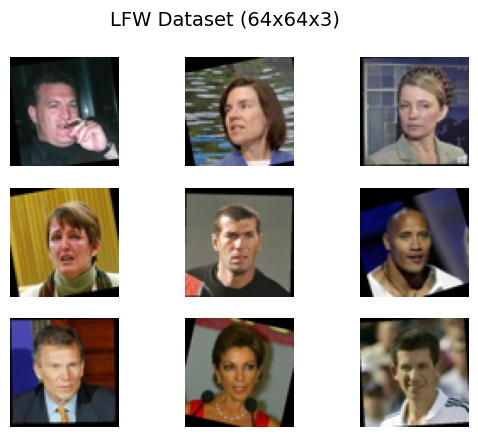

In [2]:

# Import necessary libraries
from PIL import Image
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape

# Function to preprocess the LFW dataset
def load_real_samples_from_lfw(data_dir, target_size=(64, 64), scale=False):
    """Load and preprocess images from the LFW dataset."""
    images = []
    for folder_name in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, folder_name)
        if os.path.isdir(folder_path):
            for file_name in os.listdir(folder_path):
                file_path = os.path.join(folder_path, file_name)
                try:
                    img = Image.open(file_path).convert('RGB')
                    img = img.resize(target_size)
                    img_array = np.array(img, dtype=np.float32)
                    images.append(img_array)
                except Exception as e:
                    print(f"Error loading image {file_path}: {e}")

    images = np.array(images)
    if scale:
        images = (images - 127.5) / 127.5  # Normalize to [-1, 1]
    else:
        images = images / 255.0  # Normalize to [0, 1]

    print(f"Loaded {len(images)} images from {data_dir}.")
    return images

# Function to display a grid of images
def grid_plot(images, epoch='', name='', n=3, save=False, scale=False):
    if scale:
        images = (images + 1) / 2.0
    for index in range(n * n):
        plt.subplot(n, n, 1 + index)
        plt.axis('off')
        plt.imshow(images[index])
    fig = plt.gcf()
    fig.suptitle(name + '  '+ str(epoch), fontsize=14)
    if save:
        filename = 'results/generated_plot_e%03d_f.png' % (epoch+1)
        plt.savefig(filename)
        plt.close()
    plt.show()

# Load and preprocess LFW dataset
lfw_data_dir = "/data/s4022297/assignment/idl/lfw-deepfunneled/lfw-deepfunneled"  # Replace with actual path
dataset = load_real_samples_from_lfw(lfw_data_dir, scale=False)

# Visualize some images from the dataset
grid_plot(dataset[np.random.randint(0, len(dataset), 9)], name='LFW Dataset (64x64x3)', n=3)


## 2.1. Introduction

The generative models that we are going to cover both have the following components:

1. A downsampling architecture (encoder in case of VAE, and discriminator in case of GAN) to either extract features from the data or model its distribution.
2. An upsampling architecture (decoder for VAE, generator for GAN) that will use some kind of latent vector to generate new samples that resemble the data that it was trained on.

Since we are going to be dealing with images, we are going to use convolutional networks for upsampling and downsampling, similar to what you see below.

<img src="https://i2.wp.com/sefiks.com/wp-content/uploads/2018/03/convolutional-autoencoder.png" width="500">


#### Code for building these components:

In [3]:
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape


# Define the encoder and decoder architectures
def build_conv_net(in_shape, out_shape, n_downsampling_layers=4, filters=128, out_activation='sigmoid'):
    default_args = dict(kernel_size=(3, 3), strides=(2, 2), padding='same', activation='relu')
    input = tf.keras.Input(shape=in_shape)
    x = Conv2D(filters=filters, name='enc_input', **default_args)(input)
    for _ in range(n_downsampling_layers):
        x = Conv2D(**default_args, filters=filters)(x)
    x = Flatten()(x)
    x = Dense(out_shape, activation=out_activation, name='enc_output')(x)
    model = tf.keras.Model(inputs=input, outputs=x, name='Encoder')
    model.summary()
    return model

def build_deconv_net(latent_dim, n_upsampling_layers=4, filters=128, activation_out='sigmoid'):
    input = tf.keras.Input(shape=(latent_dim,))
    x = Dense(4 * 4 * 64, input_dim=latent_dim, name='dec_input')(input)
    x = Reshape((4, 4, 64))(x)
    default_args = dict(kernel_size=(3, 3), strides=(2, 2), padding='same', activation='relu')
    for i in range(n_upsampling_layers):
        x = Conv2DTranspose(filters=filters, **default_args)(x)
    x = Conv2D(filters=3, kernel_size=(3, 3), padding='same', activation=activation_out, name='dec_output')(x)
    model = tf.keras.Model(inputs=input, outputs=x, name='Decoder')
    model.summary()
    return model


### Convolutional Autoencoder example

Using these two basic building blocks we can now build a Convolutional Autoencoder (CAE).

<img src="https://lilianweng.github.io/lil-log/assets/images/autoencoder-architecture.png" width="500">



Even though it's not a generative model, CAE is a great way to illustrate how these two components (convolutional and deconvolutional networks) can be used together to reconstruct images.

You can view such model as a compression/dimensionality reduction method as each image gets compressed to a vector of 256 numbers by the encoder and gets decompressed back into an image using the decoder network.

Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 enc_input (Conv2D)          (None, 32, 32, 128)       3584      
                                                                 
 conv2d (Conv2D)             (None, 16, 16, 128)       147584    
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_3 (Conv2D)           (None, 2, 2, 128)         147584    
                                                                 
 flatten (Flatten)           (None, 512)               0   

2024-11-19 12:54:35.029192: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 18858 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2024-11-19 12:54:35.030300: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22259 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:af:00.0, compute capability: 8.6


Model: "Decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 512)]             0         
                                                                 
 dec_input (Dense)           (None, 1024)              525312    
                                                                 
 reshape (Reshape)           (None, 4, 4, 64)          0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 128)        73856     
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 16, 16, 128)      147584    
 ranspose)                                                       
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 32, 32, 128)      1475

2024-11-19 12:54:39.383303: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8800
2024-11-19 12:54:39.771997: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2024-11-19 12:54:40.984639: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f15e458a270 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-11-19 12:54:40.984688: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-19 12:54:40.984696: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2024-11-19 12:54:40.991540: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-19 

1/1 [==============================] - 1s 504ms/step


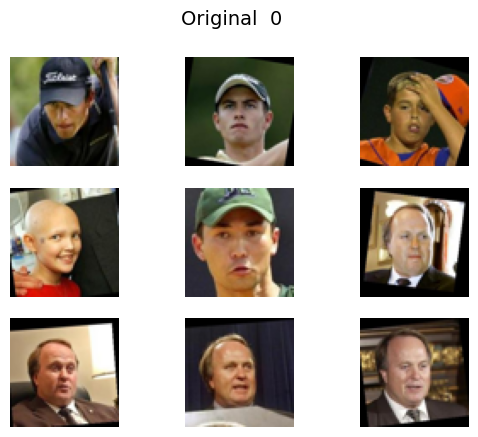

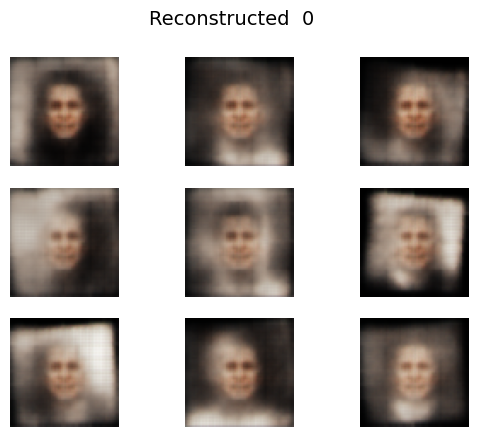


Epoch:  1
1/1 [==============================] - 0s 36ms/step


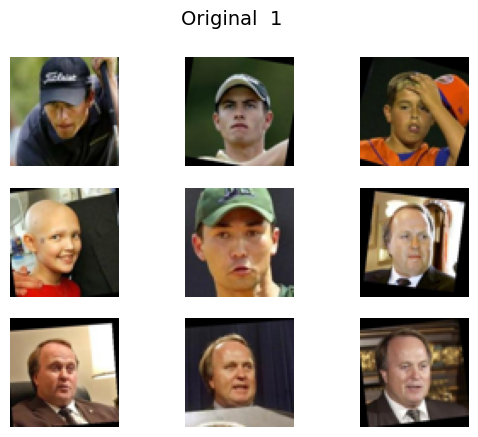

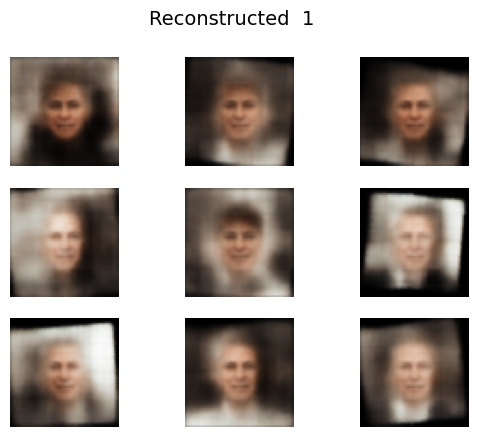


Epoch:  2
1/1 [==============================] - 0s 36ms/step


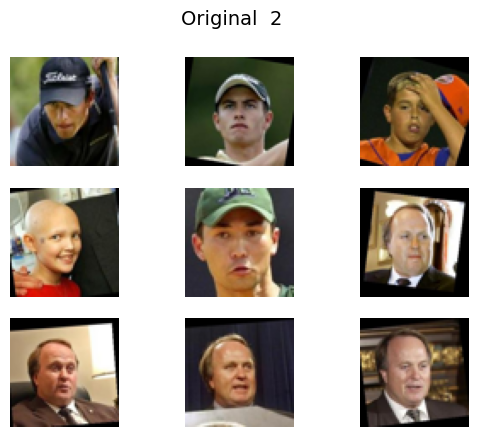

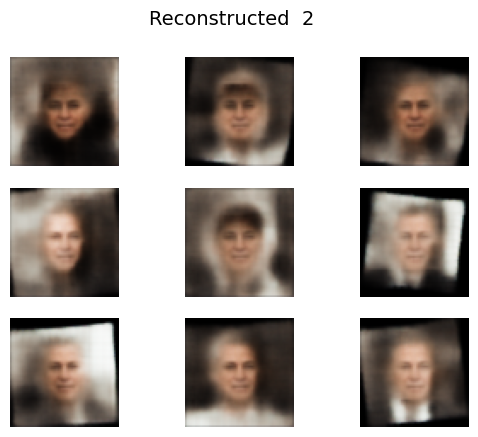


Epoch:  3
1/1 [==============================] - 0s 39ms/step


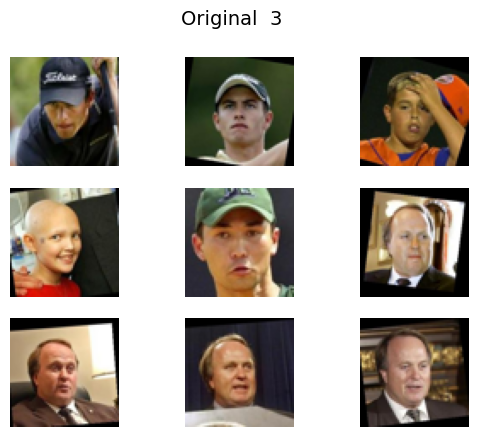

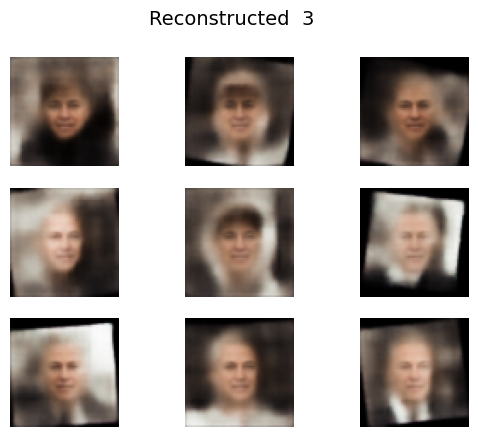


Epoch:  4
1/1 [==============================] - 0s 33ms/step


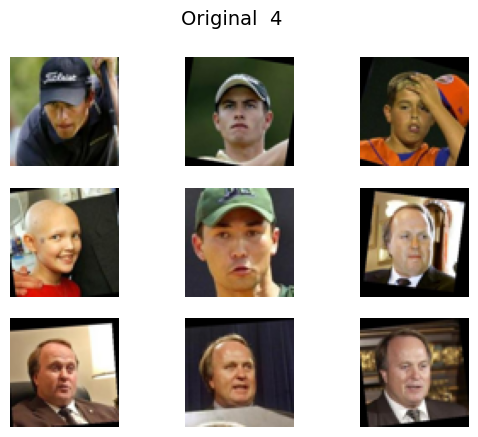

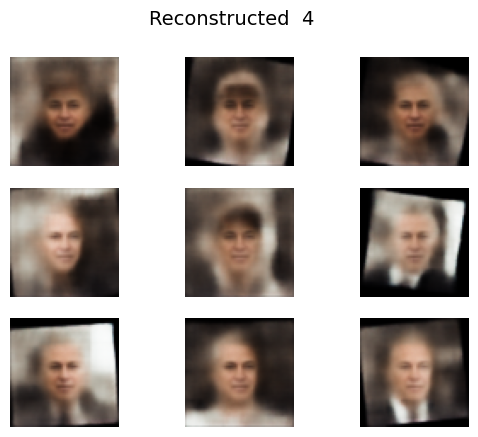


Epoch:  5
1/1 [==============================] - 0s 37ms/step


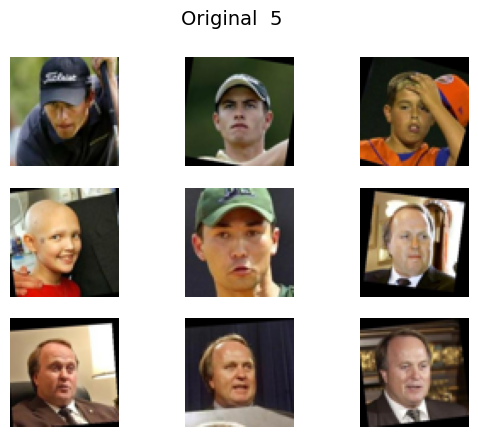

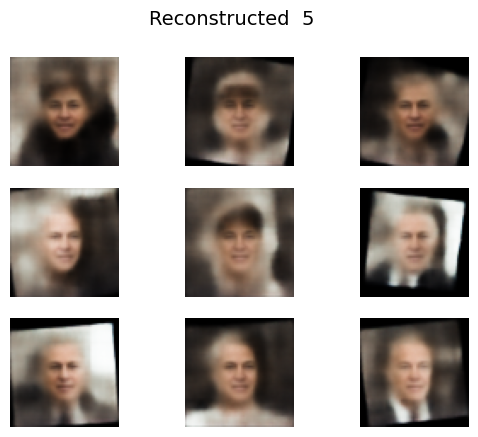


Epoch:  6
1/1 [==============================] - 0s 36ms/step


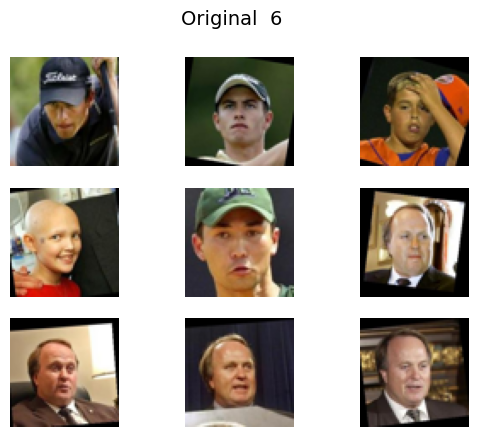

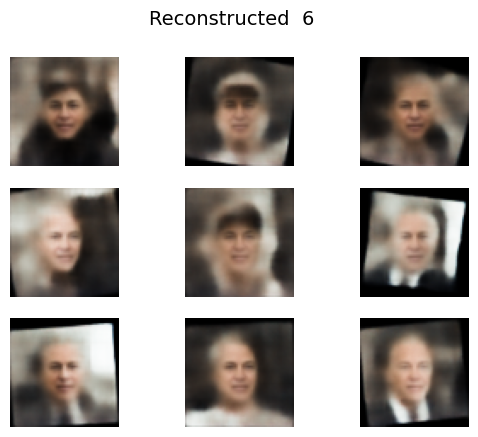


Epoch:  7
1/1 [==============================] - 0s 37ms/step


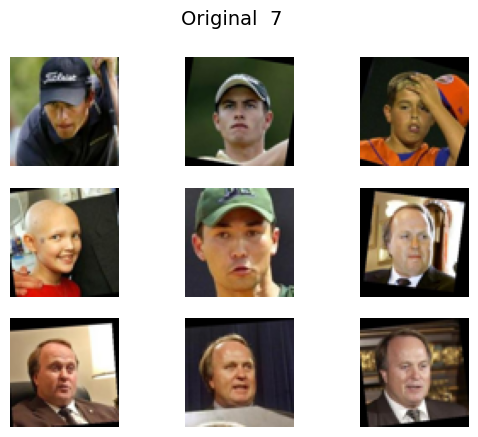

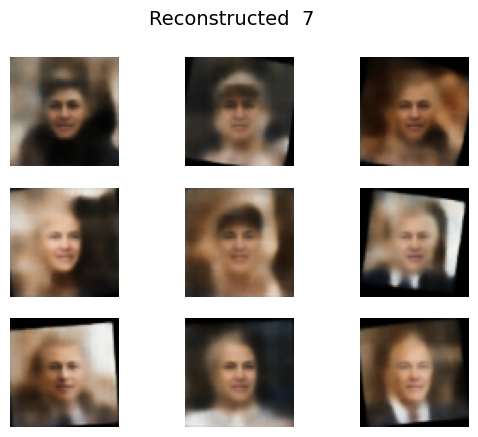


Epoch:  8
1/1 [==============================] - 0s 35ms/step


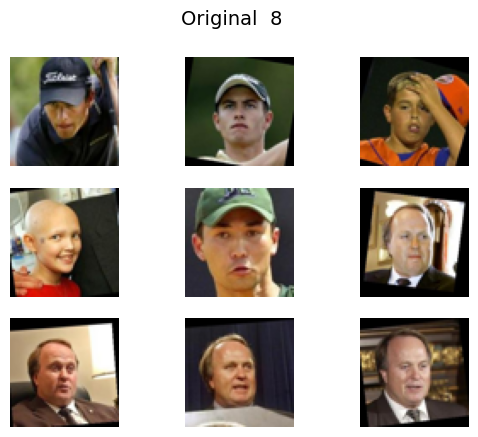

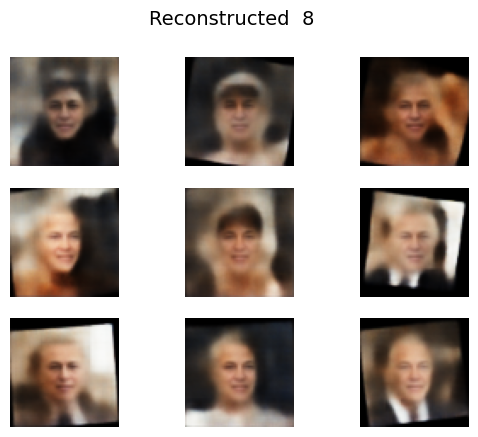


Epoch:  9
1/1 [==============================] - 0s 36ms/step


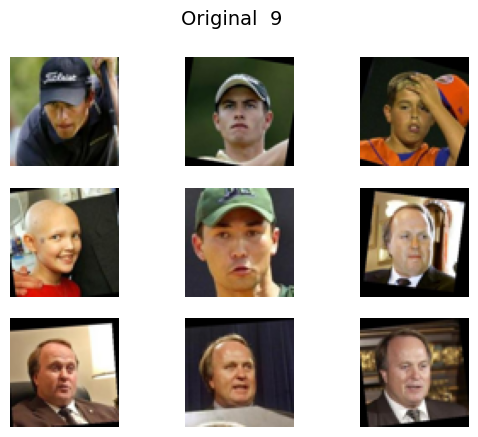

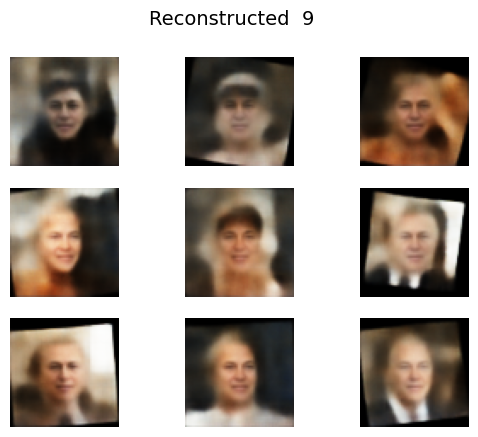


Epoch:  10
1/1 [==============================] - 0s 36ms/step


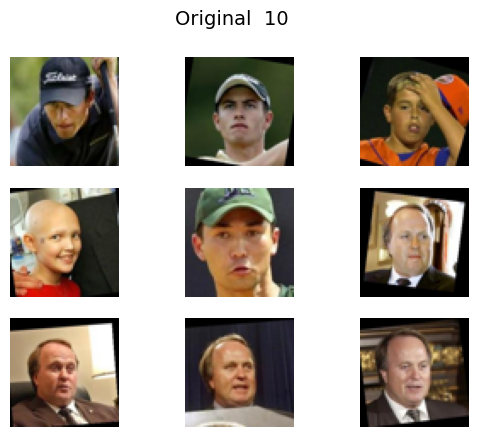

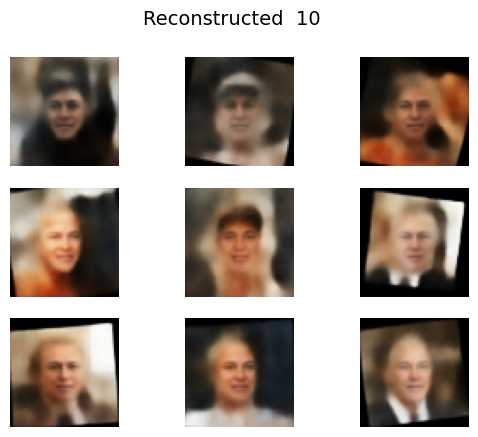


Epoch:  11
1/1 [==============================] - 0s 37ms/step


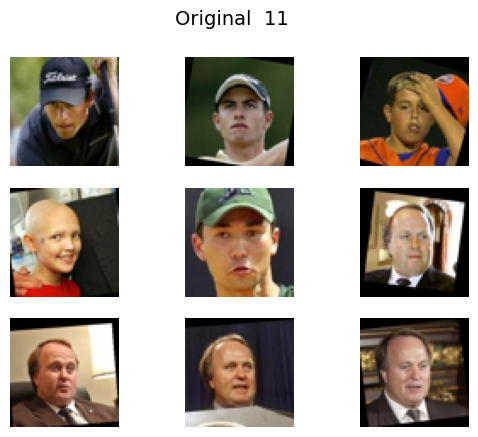

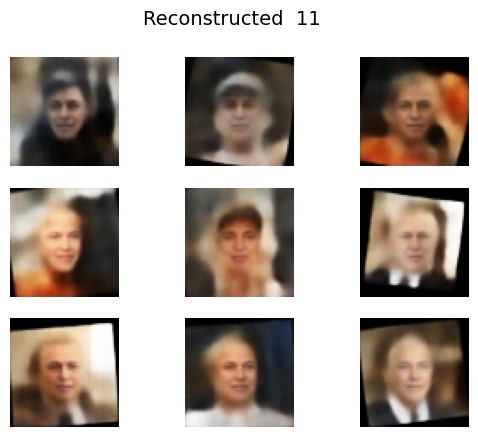


Epoch:  12
1/1 [==============================] - 0s 37ms/step


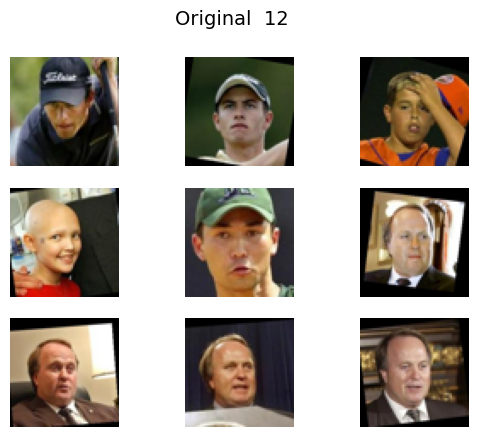

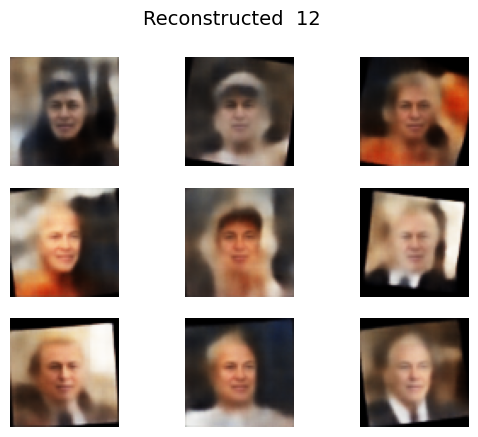


Epoch:  13
1/1 [==============================] - 0s 33ms/step


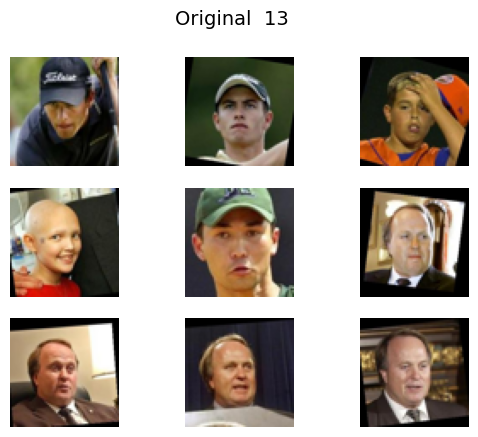

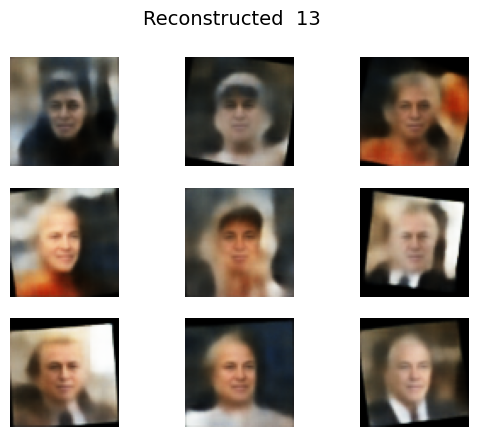


Epoch:  14
1/1 [==============================] - 0s 37ms/step


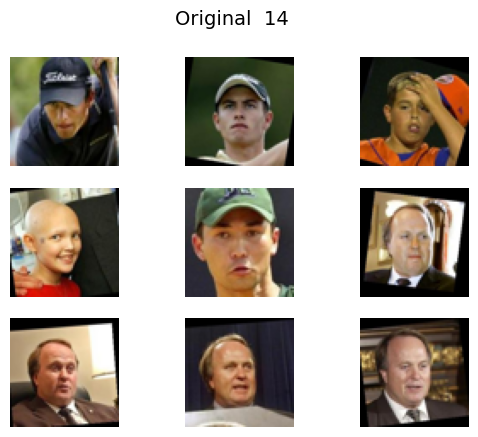

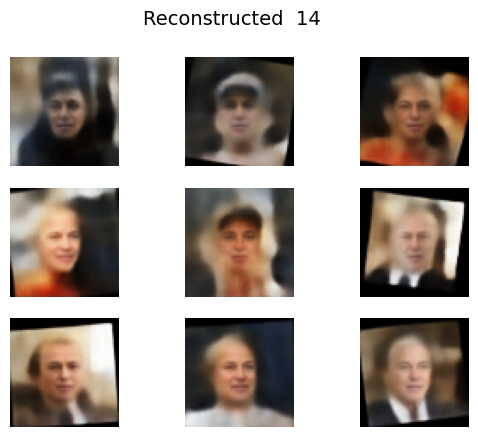


Epoch:  15
190/207 [==========================>...] - ETA: 0s - loss: 0.4868

In [ ]:
def build_convolutional_autoencoder(data_shape, latent_dim, filters=128):
    encoder = build_conv_net(in_shape=data_shape, out_shape=latent_dim, filters=filters)
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)

    # We connect encoder and decoder into a single model
    autoencoder = tf.keras.Sequential([encoder, decoder])

    # Binary crossentropy loss - pairwise comparison between input and output pixels
    autoencoder.compile(loss='binary_crossentropy', optimizer='adam')

    return autoencoder


# Defining the model dimensions and building it
image_size = dataset.shape[1:]
latent_dim = 512
num_filters = 128
cae = build_convolutional_autoencoder(image_size, latent_dim, num_filters)


## Training the Convolutional autoencoder to reconstruct images
for epoch in range(50):
    print('\nEpoch: ', epoch)

    # Note that (X=y) when training autoencoders!
    # In this case we only care about qualitative performance, we don't split into train/test sets
    cae.fit(x=dataset, y=dataset, epochs=1, batch_size=64)

    samples = dataset[:9]
    reconstructed = cae.predict(samples)
    grid_plot(samples, epoch, name='Original', n=3, save=False)
    grid_plot(reconstructed, epoch, name='Reconstructed', n=3, save=False)

*Note: You may experiment with the latent dimensionality and number of filters in your convolutional network to see how it affects the reconstruction quality. Remember that this also affects the size of the model and time it takes to train.*

---
---


## 2. 2. Variational Autoencoders (VAEs)

<img src="https://lilianweng.github.io/lil-log/assets/images/vae-gaussian.png" width="500">

#### Encoder network
This defines the approximate posterior distribution, which takes as input an observation and outputs a set of parameters for specifying the conditional distribution of the latent representation. In this example, we simply model the distribution as a diagonal Gaussian, and the network outputs the mean and log-variance parameters of a factorized Gaussian. We output log-variance instead of the variance directly for numerical stability.

#### Decoder network
This defines the conditional distribution of the observation $z$, which takes a latent sample $z$ as input and outputs the parameters for a conditional distribution of the observation. We model the latent distribution prior  as a unit Gaussian.

#### Reparameterization trick
To generate a sample  for the decoder during training, we can sample from the latent distribution defined by the parameters outputted by the encoder, given an input observation $z$. However, this sampling operation creates a bottleneck because backpropagation cannot flow through a random node.

To address this, we use a reparameterization trick. In our example, we approximate  using the decoder parameters and another parameter  as follows:

$$z = \mu + \sigma\epsilon$$

where $\mu$ and $\sigma$  represent the mean and standard deviation of a Gaussian distribution respectively. They can be derived from the decoder output. The  can be thought of as a random noise used to maintain stochasticity of $z$. We generate  from a standard normal distribution.

The latent variable  is now generated by a function of $\mu$ and $\sigma$ which would enable the model to backpropagate gradients in the encoder through $\mu$ and $\sigma$ respectively, while maintaining stochasticity through $\epsilon$.

#### Implementation

You can see how this trick is implemented below by creating a custom layer by sublassing tf.keras.layers.Layer.
It is then connected to the output of the original encoder architecture and an additional [KL](https://en.wikipedia.org/wiki/Kullback–Leibler_divergence) loss term is introduced.


In [ ]:
class Sampling(tf.keras.layers.Layer):
    """
    Custom layer for the variational autoencoder
    It takes two vectors as input - one for means and other for variances of the latent variables described by a multimodal gaussian
    Its output is a latent vector randomly sampled from this distribution
    """
    def call(self, inputs):
        z_mean, z_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_var) * epsilon

def build_vae(data_shape, latent_dim, filters=128):

    # Building the encoder - starts with a simple downsampling convolutional network
    encoder = build_conv_net(data_shape, latent_dim*2, filters=filters)

    # Adding special sampling layer that uses the reparametrization trick
    z_mean = Dense(latent_dim)(encoder.output)
    z_var = Dense(latent_dim)(encoder.output)
    z = Sampling()([z_mean, z_var])

    # Connecting the two encoder parts
    encoder = tf.keras.Model(inputs=encoder.input, outputs=z)

    # Defining the decoder which is a regular upsampling deconvolutional network
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)
    vae = tf.keras.Model(inputs=encoder.input, outputs=decoder(z))

    # Define a custom layer for the KL loss calculation
    class KLLossLayer(tf.keras.layers.Layer):
        def call(self, inputs):
            z_mean, z_var = inputs
            kl_loss = -0.5 * tf.reduce_sum(z_var - tf.square(z_mean) - tf.exp(z_var) + 1)
            # Add the KL loss to the model's losses
            self.add_loss(kl_loss / tf.cast(tf.keras.backend.prod(data_shape), tf.float32))
            return inputs  # Pass through the inputs unchanged

    # Apply the custom layer to z_mean and z_var
    _, _ = KLLossLayer()([z_mean, z_var])

    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='binary_crossentropy')

    return encoder, decoder, vae

Model: "Encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ enc_input (Conv2D)                   │ (None, 32, 32, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 8, 8, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 4, 4, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 2, 2, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ enc_output (Dense)                   │ (None, 128)                 │          32,896 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 182,400 (712.50 KB)

 Trainable params: 182,400 (712.50 KB)

 Non-trainable params: 0 (0.00 B)

Model: "Decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dec_input (Dense)                    │ (None, 1024)                │          66,560 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 8, 8, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_5 (Conv2DTranspose) │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_6 (Conv2DTranspose) │ (None, 32, 32, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_7 (Conv2DTranspose) │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dec_output (Conv2D)                  │ (None, 64, 64, 3)           │           1,731 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 216,003 (843.76 KB)

 Trainable params: 216,003 (843.76 KB)

 Non-trainable params: 0 (0.00 B)

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 24s 9ms/step - loss: 0.5810


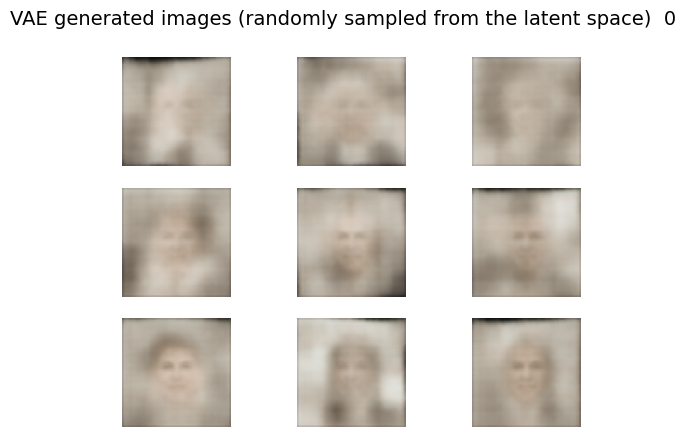

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.5221


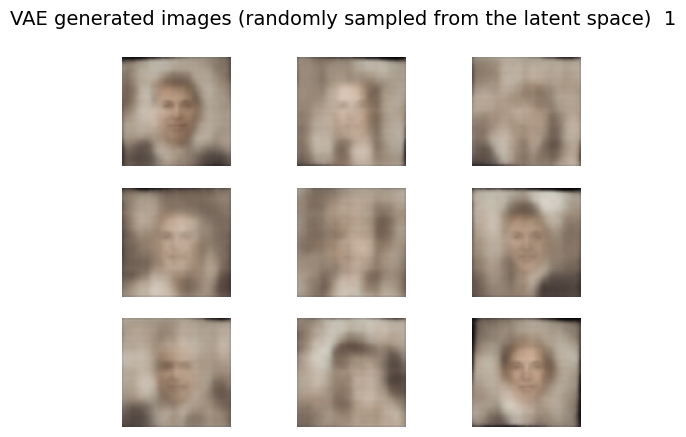

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.5148


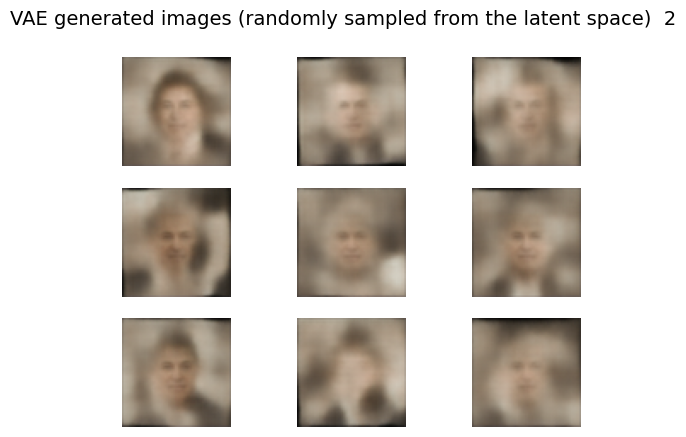

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.5113


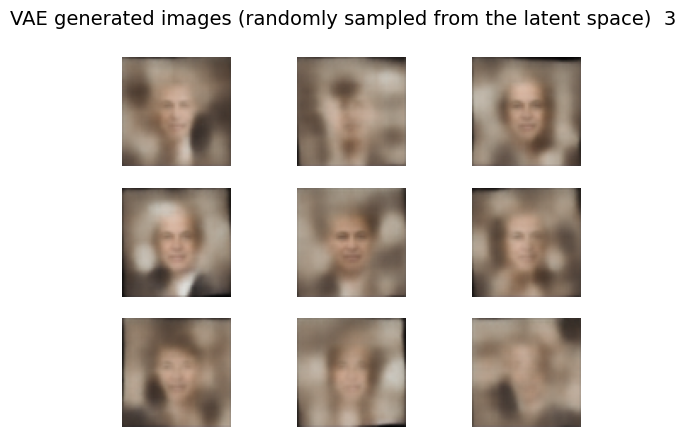

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.5081


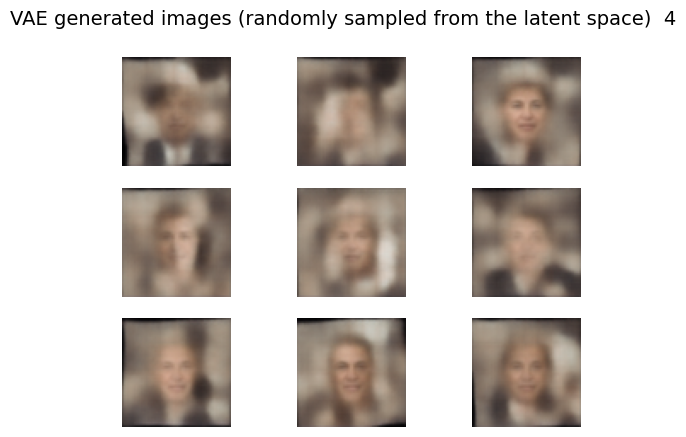

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.5073


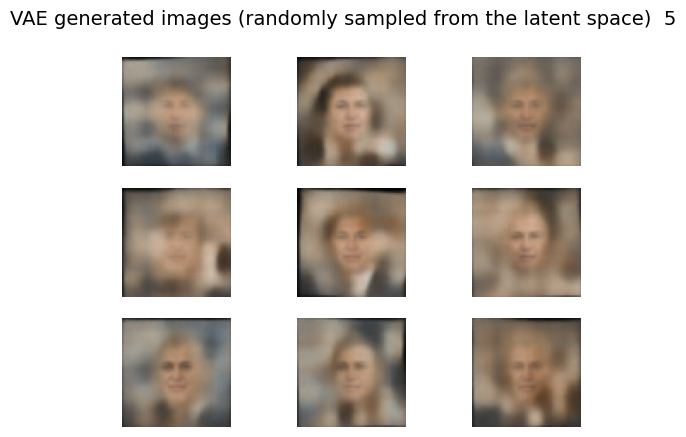

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.5038


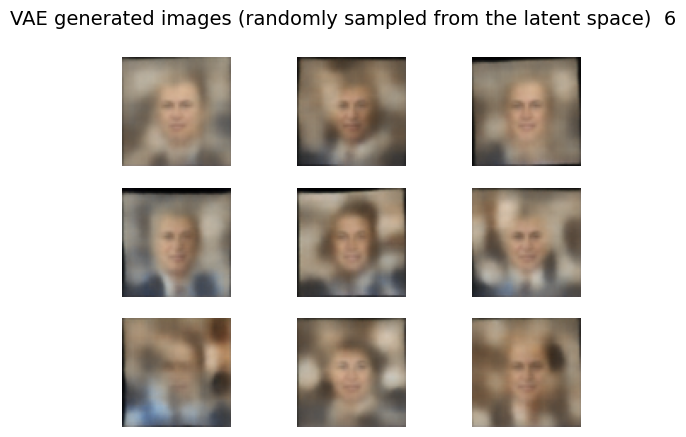

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.5010


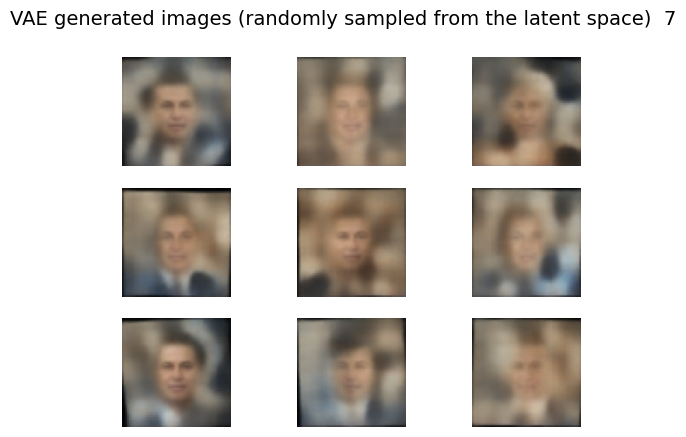

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.4982


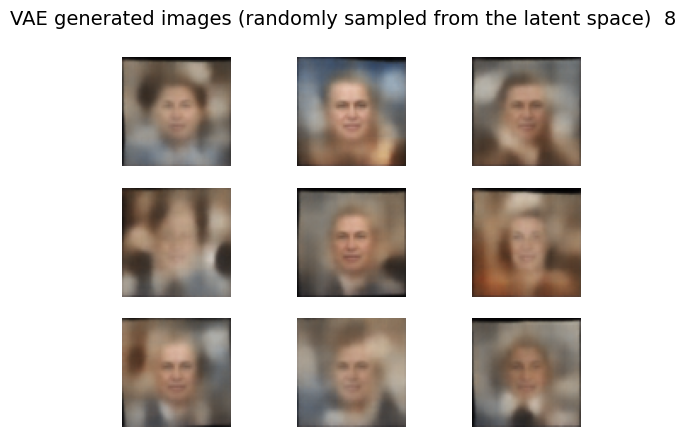

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4969


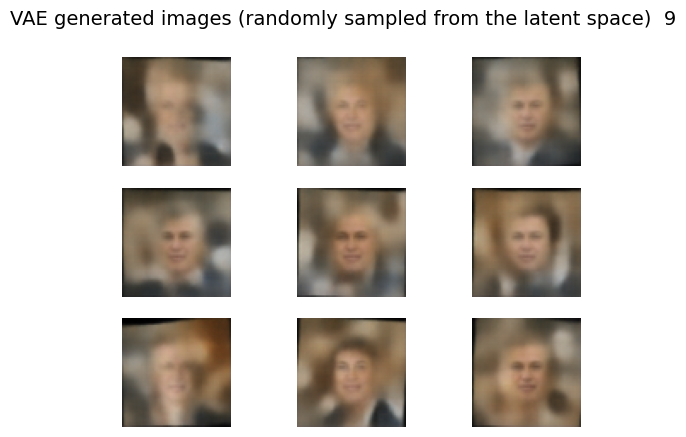

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4975


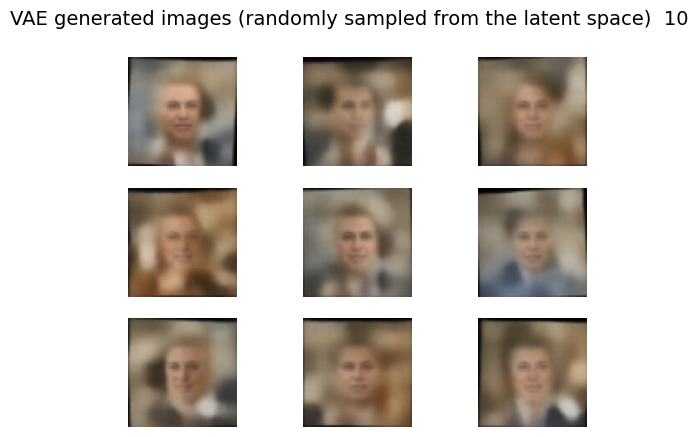

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4974


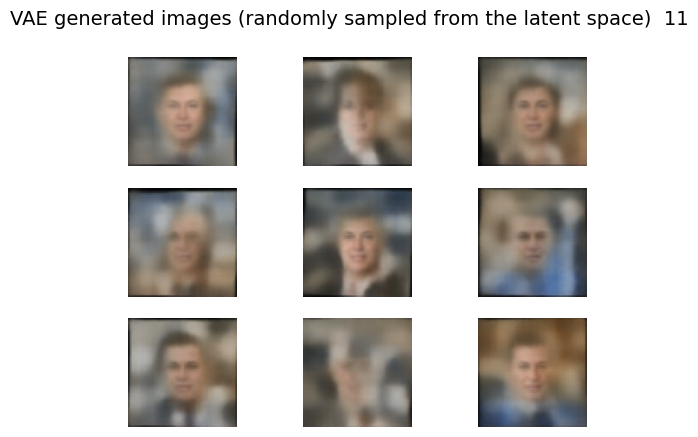

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4959


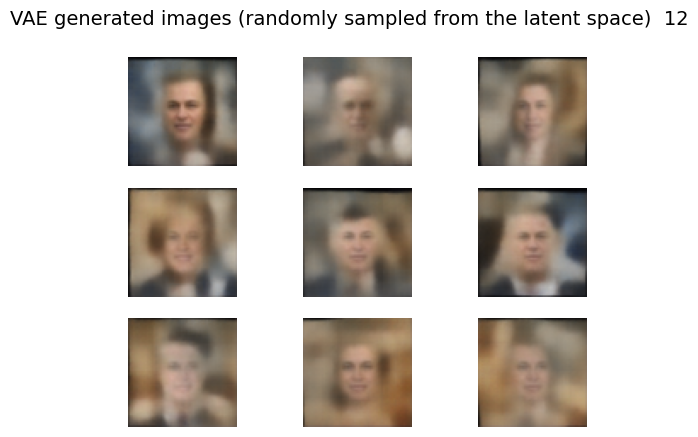

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.4954


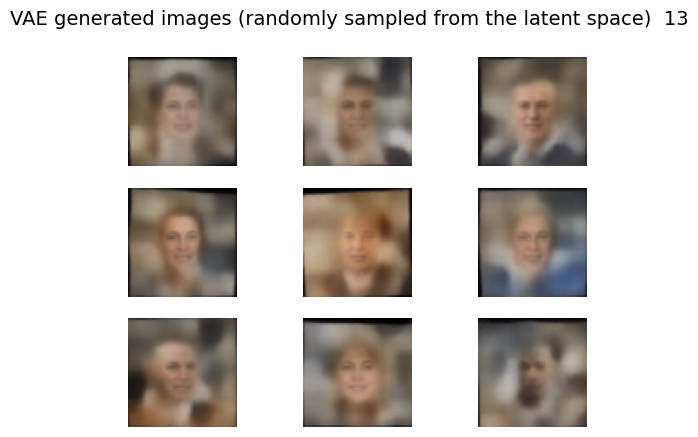

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4961


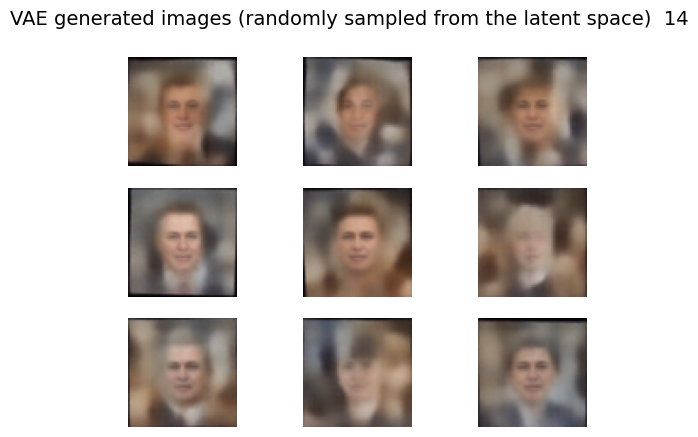

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4953


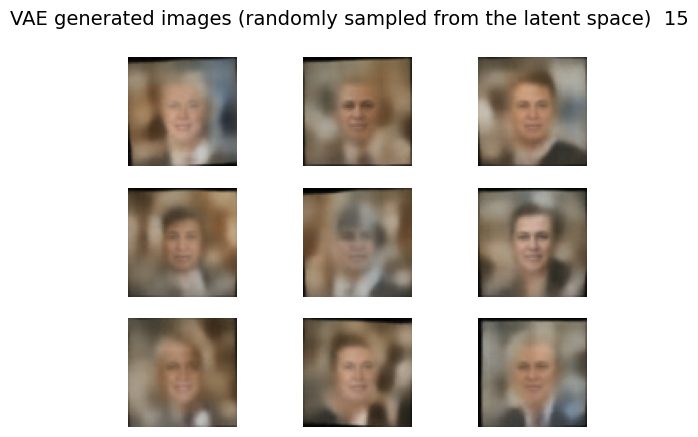

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - loss: 0.4951


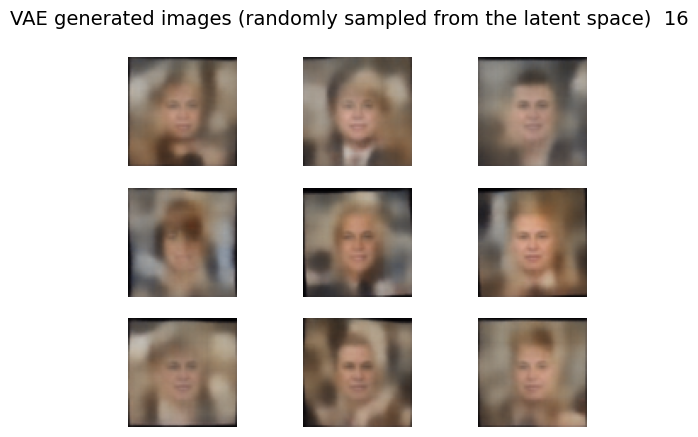

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4944


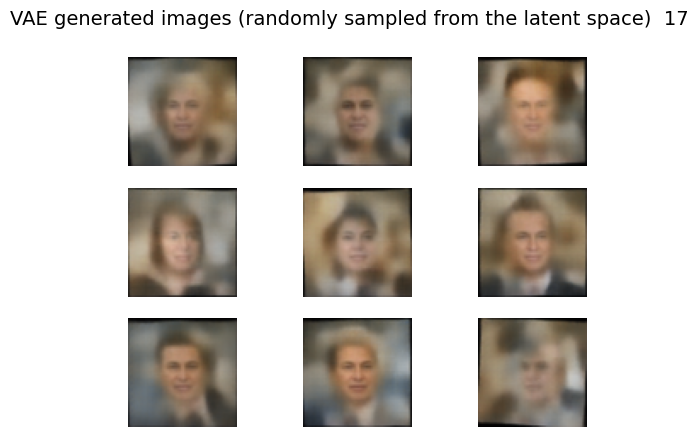

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4928


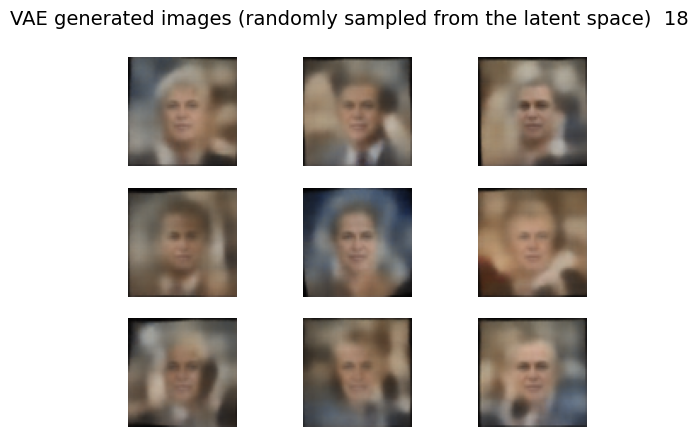

1655/1655 ━━━━━━━━━━━━━━━━━━━━ 10s 6ms/step - loss: 0.4922


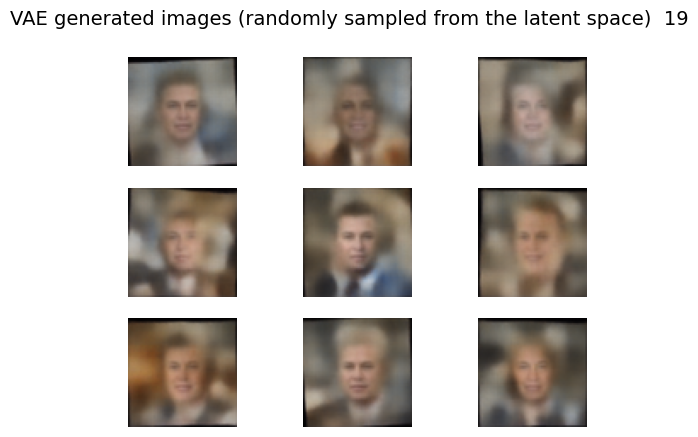

In [ ]:
# Training the VAE model

latent_dim = 64
encoder, decoder, vae = build_vae(dataset.shape[1:], latent_dim, filters=64)

# Generate random vectors that we will use to sample our latent space
for epoch in range(20):
    latent_vectors = np.random.randn(9, latent_dim)/6
    vae.fit(x=dataset, y=dataset, epochs=1, batch_size=8)

    images = decoder(latent_vectors)
    grid_plot(images, epoch, name='VAE generated images (randomly sampled from the latent space)', n=3, save=False)

*Note: again, you might experiment with the latent dimensionality, batch size and the architecture of your convolutional nets to see how it affects the generative capabilities of this model.*

---

## 2.3 Generative Adversarial Networks (GANs)

### GAN architecture
Generative adversarial networks consist of two models: a generative model and a discriminative model.

<img src="https://media.springernature.com/original/springer-static/image/chp%3A10.1007%2F978-1-4842-3679-6_8/MediaObjects/463582_1_En_8_Fig1_HTML.jpg" width="500">

**The discriminator** model is a classifier that determines whether a given image looks like a real image from the dataset or like an artificially created image. This is basically a binary classifier that will take the form of a normal convolutional neural network (CNN).
As an input this network will get samples both from the dataset that it is trained on and on the samples generated by the **generator**.

The **generator** model takes random input values (noise) and transforms them into images through a deconvolutional neural network.

Over the course of many training iterations, the weights and biases in the discriminator and the generator are trained through backpropagation. The discriminator learns to tell "real" images of handwritten digits apart from "fake" images created by the generator. At the same time, the generator uses feedback from the discriminator to learn how to produce convincing images that the discriminator can't distinguish from real images.




In [4]:
from tensorflow.keras.optimizers import Adam

def build_gan(data_shape, latent_dim, filters=128, lr=0.0002, beta_1=0.5):
    # Use Adam optimizer directly; avoid reusing an already wrapped optimizer
    optimizer = Adam(learning_rate=lr, beta_1=beta_1)

    # Build the generator
    generator = build_deconv_net(latent_dim, activation_out='tanh', filters=filters)

    # Build and compile the discriminator
    discriminator = build_conv_net(in_shape=data_shape, out_shape=1, filters=filters)  # Single output for binary classification
    discriminator.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=lr, beta_1=beta_1))

    # Combined GAN: freeze the discriminator during generator training
    discriminator.trainable = False
    true_fake_prediction = discriminator(generator.output)
    gan = tf.keras.Model(inputs=generator.input, outputs=true_fake_prediction)
    gan.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=lr, beta_1=beta_1))

    return discriminator, generator, gan

### Definining custom functions for training your GANs

---




In [5]:
from tensorflow.keras import mixed_precision
import warnings
import logging


# Enable mixed precision for memory optimization
mixed_precision.set_global_policy('mixed_float16')


# Define utility functions
def run_generator(generator, n_samples=100, latent_dim=128):
    """
    Run the generator model and generate n samples of synthetic images using random latent vectors.
    """
    generator_input = np.random.randn(n_samples, latent_dim)
    return generator.predict(generator_input)

def get_batch(generator, dataset, batch_size=64, latent_dim=128):
    """
    Get a single batch of real and fake samples for discriminator training.
    """
    batch_size //= 2  # Half real, half fake samples
    fake_data = run_generator(generator, n_samples=batch_size, latent_dim=latent_dim)
    real_data = dataset[np.random.randint(0, dataset.shape[0], batch_size)]
    X = np.concatenate([fake_data, real_data], axis=0)
    y = np.concatenate([np.zeros((batch_size, 1)), np.ones((batch_size, 1))], axis=0)
    return X, y

def train_gan(generator, discriminator, gan, dataset, latent_dim=128, n_epochs=20, batch_size=16):
    """
    Train the GAN and save generated images periodically.
    """
    os.makedirs("generated_images", exist_ok=True)  # Directory for saving images
    batches_per_epoch = len(dataset) // batch_size
    for epoch in range(n_epochs):
        print(f"Epoch {epoch + 1}/{n_epochs}")
        for batch in tqdm(range(batches_per_epoch)):
            # Train the discriminator
            X, y = get_batch(generator, dataset, batch_size=batch_size, latent_dim=latent_dim)
            discriminator_loss = discriminator.train_on_batch(X, y)

            # Train the generator
            noise = np.random.randn(batch_size, latent_dim)
            y_gan = np.ones((batch_size, 1))  # Fake images labeled as real for generator training
            generator_loss = gan.train_on_batch(noise, y_gan)

        # Save generated images every few epochs
        if (epoch + 1) % 5 == 0:  # Save every 5 epochs
            noise = np.random.randn(16, latent_dim)
            generated_images = generator.predict(noise)
            save_images(generated_images, epoch)

# Function to save a grid of generated images
def save_images(images, epoch, scale=True):
    """
    Save a grid of images generated by the GAN.
    """
    import matplotlib.pyplot as plt
    import numpy as np

    if scale:
        # Ensure images are in range [0, 1] for saving
        images = (images + 1) / 2.0  # Rescale from [-1, 1] to [0, 1]

    # Ensure images are float32
    images = images.astype(np.float32)

    # Create a grid plot
    n = int(len(images)**0.5)
    fig, axs = plt.subplots(n, n, figsize=(10, 10))
    for i in range(n):
        for j in range(n):
            axs[i, j].imshow(images[i * n + j])
            axs[i, j].axis('off')
    plt.tight_layout()

    # Save to file
    filename = f"generated_images/epoch_{epoch + 1}.png"
    plt.savefig(filename)
    plt.close()
    print(f"Saved generated images to {filename}")



INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPUs will likely run quickly with dtype policy mixed_float16 as they all have compute capability of at least 7.0


In [6]:
import os
from PIL import Image
import numpy as np

def load_real_samples_from_directory(data_dir, target_size=(64, 64), scale=False):
    """
    Load images from a directory, preprocess them, and return as a numpy array.

    Args:
    - data_dir (str): Path to the directory containing the dataset.
    - target_size (tuple): Desired size for resizing images (width, height).
    - scale (bool): If True, scale images to [-1, 1]; otherwise, normalize to [0, 1].

    Returns:
    - np.ndarray: Array of preprocessed images.
    """
    images = []
    for root, _, files in os.walk(data_dir):
        for file_name in files:
            if file_name.endswith(('.png', '.jpg', '.jpeg')):  # Add more extensions if needed
                file_path = os.path.join(root, file_name)
                try:
                    img = Image.open(file_path).convert('RGB')  # Ensure 3-channel RGB
                    img = img.resize(target_size)
                    img_array = np.array(img, dtype=np.float32)
                    images.append(img_array)
                except Exception as e:
                    print(f"Error loading image {file_path}: {e}")

    images = np.array(images)
    if scale:
        images = (images - 127.5) / 127.5  # Normalize to [-1, 1]
    else:
        images = images / 255.0  # Normalize to [0, 1]

    print(f"Loaded {len(images)} images from {data_dir}.")
    return images


In [ ]:
dataset_dir = lfw_data_dir
dataset_scaled = load_real_samples_from_directory(dataset_dir, target_size=(64, 64), scale=True)
print("Dataset shape:", dataset_scaled.shape)


In [ ]:
import os
import tensorflow as tf
import logging
import warnings

# Suppress TensorFlow logs
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress INFO, WARNING, and DEBUG logs
os.environ['TF_CPP_MIN_VLOG_LEVEL'] = '3'  # Suppress verbose executor logs
tf.get_logger().setLevel(logging.ERROR)  # Suppress Python-level TensorFlow warnings
logging.getLogger('tensorflow').setLevel(logging.ERROR)

# Suppress general Python warnings
warnings.filterwarnings('ignore', category=FutureWarning)  # Suppress FutureWarnings
warnings.filterwarnings('ignore', category=DeprecationWarning)  # Suppress DeprecationWarnings


# Build the GAN models (Generator, Discriminator, and combined GAN)
latent_dim = 256  # Reduce latent dimensions for lower memory usage
discriminator, generator, gan = build_gan(dataset_scaled.shape[1:], latent_dim, filters=32)  # Lower filters

# Train the GAN with optimized settings
train_gan(generator, discriminator, gan, dataset_scaled, latent_dim=latent_dim, n_epochs=20, batch_size=16)

2024-11-22 16:13:17.930523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:17.951568: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 26%|██████████████████████████████▉                                                                                      | 219/827 [00:29<01:10,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:18.049855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.069231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|███████████████████████████████                                                                                      | 220/827 [00:29<01:10,  8.55it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:18.157825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.176681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|███████████████████████████████▎                                                                                     | 221/827 [00:29<01:09,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:18.273232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.295363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|███████████████████████████████▍                                                                                     | 222/827 [00:29<01:09,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:18.389410: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.412295: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|███████████████████████████████▌                                                                                     | 223/827 [00:29<01:09,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:18.506746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.529244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|███████████████████████████████▋                                                                                     | 224/827 [00:29<01:10,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:18.617825: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.636971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|███████████████████████████████▊                                                                                     | 225/827 [00:30<01:08,  8.79it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:18.725246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.743862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|███████████████████████████████▉                                                                                     | 226/827 [00:30<01:07,  8.86it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:18.842981: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.863296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 27%|████████████████████████████████                                                                                     | 227/827 [00:30<01:08,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:18.963573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:18.986824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|████████████████████████████████▎                                                                                    | 228/827 [00:30<01:09,  8.56it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:19.078534: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.096359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|████████████████████████████████▍                                                                                    | 229/827 [00:30<01:08,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:19.192441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.208995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|████████████████████████████████▌                                                                                    | 230/827 [00:30<01:07,  8.82it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:19.295881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.317759: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|████████████████████████████████▋                                                                                    | 231/827 [00:30<01:07,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:19.411357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.428934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|████████████████████████████████▊                                                                                    | 232/827 [00:30<01:06,  8.93it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:19.516781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.536618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|████████████████████████████████▉                                                                                    | 233/827 [00:30<01:06,  8.96it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:19.626854: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.648437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|█████████████████████████████████                                                                                    | 234/827 [00:31<01:05,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:19.738703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.760574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 28%|█████████████████████████████████▏                                                                                   | 235/827 [00:31<01:06,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:19.859351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.877405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|█████████████████████████████████▍                                                                                   | 236/827 [00:31<01:06,  8.85it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:19.974549: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:19.994775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|█████████████████████████████████▌                                                                                   | 237/827 [00:31<01:07,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:20.083921: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.101558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|█████████████████████████████████▋                                                                                   | 238/827 [00:31<01:05,  8.93it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:20.198695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.220636: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|█████████████████████████████████▊                                                                                   | 239/827 [00:31<01:07,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:20.318394: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.337714: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|█████████████████████████████████▉                                                                                   | 240/827 [00:31<01:07,  8.70it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:20.431040: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.451263: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|██████████████████████████████████                                                                                   | 241/827 [00:31<01:06,  8.76it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:20.541684: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.559132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|██████████████████████████████████▏                                                                                  | 242/827 [00:32<01:05,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:20.648224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.667304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 29%|██████████████████████████████████▍                                                                                  | 243/827 [00:32<01:05,  8.98it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:20.754668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.771803: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|██████████████████████████████████▌                                                                                  | 244/827 [00:32<01:03,  9.16it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:20.868168: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:20.889407: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|██████████████████████████████████▋                                                                                  | 245/827 [00:32<01:05,  8.95it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:20.983890: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.001566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|██████████████████████████████████▊                                                                                  | 246/827 [00:32<01:04,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:21.093156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.111059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|██████████████████████████████████▉                                                                                  | 247/827 [00:32<01:04,  9.05it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:21.203973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.219939: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|███████████████████████████████████                                                                                  | 248/827 [00:32<01:03,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:21.313855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.333465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|███████████████████████████████████▏                                                                                 | 249/827 [00:32<01:04,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:21.428086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.450239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|███████████████████████████████████▎                                                                                 | 250/827 [00:32<01:05,  8.86it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:21.542577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.559796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|███████████████████████████████████▌                                                                                 | 251/827 [00:33<01:04,  8.92it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:21.652239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.669566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 30%|███████████████████████████████████▋                                                                                 | 252/827 [00:33<01:03,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:21.759938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.781881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|███████████████████████████████████▊                                                                                 | 253/827 [00:33<01:03,  9.00it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:21.871542: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:21.888753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|███████████████████████████████████▉                                                                                 | 254/827 [00:33<01:02,  9.10it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:21.984863: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.005469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|████████████████████████████████████                                                                                 | 255/827 [00:33<01:04,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:22.095926: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.113664: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|████████████████████████████████████▏                                                                                | 256/827 [00:33<01:03,  9.06it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:22.201630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.219677: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|████████████████████████████████████▎                                                                                | 257/827 [00:33<01:02,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:22.308555: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.330224: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|████████████████████████████████████▌                                                                                | 258/827 [00:33<01:02,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:22.427331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.447992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|████████████████████████████████████▋                                                                                | 259/827 [00:33<01:03,  8.90it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:22.540821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.564069: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 31%|████████████████████████████████████▊                                                                                | 260/827 [00:34<01:04,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:22.658680: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.678310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|████████████████████████████████████▉                                                                                | 261/827 [00:34<01:04,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:22.765551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.784689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|█████████████████████████████████████                                                                                | 262/827 [00:34<01:02,  9.04it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:22.869133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:22.891736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|█████████████████████████████████████▏                                                                               | 263/827 [00:34<01:02,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:22.993897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.017115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|█████████████████████████████████████▎                                                                               | 264/827 [00:34<01:05,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:23.113056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.132058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|█████████████████████████████████████▍                                                                               | 265/827 [00:34<01:04,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:23.221540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.242443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|█████████████████████████████████████▋                                                                               | 266/827 [00:34<01:03,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:23.333978: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.353614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|█████████████████████████████████████▊                                                                               | 267/827 [00:34<01:03,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:23.453075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.473545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 32%|█████████████████████████████████████▉                                                                               | 268/827 [00:34<01:04,  8.71it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:23.568968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.586469: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|██████████████████████████████████████                                                                               | 269/827 [00:35<01:03,  8.78it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:23.681817: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.702058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|██████████████████████████████████████▏                                                                              | 270/827 [00:35<01:04,  8.70it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:23.791418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.813496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|██████████████████████████████████████▎                                                                              | 271/827 [00:35<01:02,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:23.907269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:23.929622: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|██████████████████████████████████████▍                                                                              | 272/827 [00:35<01:03,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:24.032592: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.054063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|██████████████████████████████████████▌                                                                              | 273/827 [00:35<01:05,  8.45it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:24.147733: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.164447: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|██████████████████████████████████████▊                                                                              | 274/827 [00:35<01:03,  8.72it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:24.251824: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.273603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|██████████████████████████████████████▉                                                                              | 275/827 [00:35<01:02,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:24.363847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.385649: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|███████████████████████████████████████                                                                              | 276/827 [00:35<01:02,  8.84it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:24.475229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.493300: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 33%|███████████████████████████████████████▏                                                                             | 277/827 [00:35<01:00,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:24.585987: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.605111: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|███████████████████████████████████████▎                                                                             | 278/827 [00:36<01:01,  8.97it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:24.700429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.719113: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|███████████████████████████████████████▍                                                                             | 279/827 [00:36<01:01,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:24.813187: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.830250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|███████████████████████████████████████▌                                                                             | 280/827 [00:36<01:01,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:24.926335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:24.943473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|███████████████████████████████████████▊                                                                             | 281/827 [00:36<01:01,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:25.037742: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.055372: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|███████████████████████████████████████▉                                                                             | 282/827 [00:36<01:00,  8.95it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:25.144581: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.168265: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|████████████████████████████████████████                                                                             | 283/827 [00:36<01:01,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:25.262798: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.285137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|████████████████████████████████████████▏                                                                            | 284/827 [00:36<01:01,  8.78it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:25.379782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.402027: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 34%|████████████████████████████████████████▎                                                                            | 285/827 [00:36<01:01,  8.75it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:25.488334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.507756: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|████████████████████████████████████████▍                                                                            | 286/827 [00:36<01:00,  8.93it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:25.593999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.614259: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|████████████████████████████████████████▌                                                                            | 287/827 [00:37<00:59,  9.07it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:25.702014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.724025: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|████████████████████████████████████████▋                                                                            | 288/827 [00:37<00:59,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:25.817448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.838305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|████████████████████████████████████████▉                                                                            | 289/827 [00:37<00:59,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:25.939942: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:25.962720: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|█████████████████████████████████████████                                                                            | 290/827 [00:37<01:02,  8.66it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:26.068782: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.091603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|█████████████████████████████████████████▏                                                                           | 291/827 [00:37<01:04,  8.33it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:26.192504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.212264: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|█████████████████████████████████████████▎                                                                           | 292/827 [00:37<01:03,  8.36it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:26.313250: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.335157: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 35%|█████████████████████████████████████████▍                                                                           | 293/827 [00:37<01:04,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:26.438596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.457694: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|█████████████████████████████████████████▌                                                                           | 294/827 [00:37<01:04,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:26.570146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.589896: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|█████████████████████████████████████████▋                                                                           | 295/827 [00:38<01:06,  8.05it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:26.689233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.708836: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|█████████████████████████████████████████▉                                                                           | 296/827 [00:38<01:05,  8.17it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:26.814596: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.834269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|██████████████████████████████████████████                                                                           | 297/827 [00:38<01:05,  8.09it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:26.930169: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:26.949599: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|██████████████████████████████████████████▏                                                                          | 298/827 [00:38<01:04,  8.26it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:27.050701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.070938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|██████████████████████████████████████████▎                                                                          | 299/827 [00:38<01:04,  8.21it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:27.177046: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.199021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|██████████████████████████████████████████▍                                                                          | 300/827 [00:38<01:05,  8.11it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:27.297061: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.319373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 36%|██████████████████████████████████████████▌                                                                          | 301/827 [00:38<01:04,  8.12it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:27.415412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.436286: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|██████████████████████████████████████████▋                                                                          | 302/827 [00:38<01:03,  8.25it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:27.535750: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.558559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|██████████████████████████████████████████▊                                                                          | 303/827 [00:39<01:03,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:27.649448: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.669722: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|███████████████████████████████████████████                                                                          | 304/827 [00:39<01:01,  8.51it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:27.757139: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.775740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|███████████████████████████████████████████▏                                                                         | 305/827 [00:39<00:59,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:27.870846: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:27.891777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|███████████████████████████████████████████▎                                                                         | 306/827 [00:39<00:59,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:27.983235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.004063: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|███████████████████████████████████████████▍                                                                         | 307/827 [00:39<00:59,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:28.096030: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.113787: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|███████████████████████████████████████████▌                                                                         | 308/827 [00:39<00:58,  8.87it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:28.217137: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.239879: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|███████████████████████████████████████████▋                                                                         | 309/827 [00:39<01:00,  8.58it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:28.330793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.349186: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 37%|███████████████████████████████████████████▊                                                                         | 310/827 [00:39<00:59,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:28.443651: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.462623: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|███████████████████████████████████████████▉                                                                         | 311/827 [00:39<00:58,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:28.559178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.581452: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|████████████████████████████████████████████▏                                                                        | 312/827 [00:40<00:59,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:28.672499: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.690880: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|████████████████████████████████████████████▎                                                                        | 313/827 [00:40<00:58,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:28.777456: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.796600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|████████████████████████████████████████████▍                                                                        | 314/827 [00:40<00:57,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:28.884150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:28.903249: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|████████████████████████████████████████████▌                                                                        | 315/827 [00:40<00:56,  9.08it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:28.997654: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.016748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|████████████████████████████████████████████▋                                                                        | 316/827 [00:40<00:56,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:29.107726: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.128897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|████████████████████████████████████████████▊                                                                        | 317/827 [00:40<00:57,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:29.227691: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.245800: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 38%|████████████████████████████████████████████▉                                                                        | 318/827 [00:40<00:57,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:29.340541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.361336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|█████████████████████████████████████████████▏                                                                       | 319/827 [00:40<00:57,  8.77it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:29.452199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.474278: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|█████████████████████████████████████████████▎                                                                       | 320/827 [00:40<00:57,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:29.564269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.585867: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|█████████████████████████████████████████████▍                                                                       | 321/827 [00:41<00:57,  8.84it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:29.677601: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.698531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|█████████████████████████████████████████████▌                                                                       | 322/827 [00:41<00:57,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:29.791316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.811860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|█████████████████████████████████████████████▋                                                                       | 323/827 [00:41<00:57,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:29.902312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:29.919388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|█████████████████████████████████████████████▊                                                                       | 324/827 [00:41<00:55,  9.01it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.007697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.026668: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|█████████████████████████████████████████████▉                                                                       | 325/827 [00:41<00:55,  9.11it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.112014: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.129730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 39%|██████████████████████████████████████████████                                                                       | 326/827 [00:41<00:53,  9.30it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.225920: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.249893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|██████████████████████████████████████████████▎                                                                      | 327/827 [00:41<00:56,  8.93it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:30.349377: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.370161: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|██████████████████████████████████████████████▍                                                                      | 328/827 [00:41<00:56,  8.78it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.457323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.475719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|██████████████████████████████████████████████▌                                                                      | 329/827 [00:41<00:55,  8.94it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.562848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.581177: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|██████████████████████████████████████████████▋                                                                      | 330/827 [00:42<00:54,  9.05it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:30.673472: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.690178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|██████████████████████████████████████████████▊                                                                      | 331/827 [00:42<00:54,  9.15it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.779595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.798772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|██████████████████████████████████████████████▉                                                                      | 332/827 [00:42<00:53,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.891459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:30.908946: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|███████████████████████████████████████████████                                                                      | 333/827 [00:42<00:53,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:30.996160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.015670: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 40%|███████████████████████████████████████████████▎                                                                     | 334/827 [00:42<00:53,  9.16it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:31.107077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.129511: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|███████████████████████████████████████████████▍                                                                     | 335/827 [00:42<00:54,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:31.226468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.246108: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|███████████████████████████████████████████████▌                                                                     | 336/827 [00:42<00:54,  8.94it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:31.340248: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.362379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|███████████████████████████████████████████████▋                                                                     | 337/827 [00:42<00:55,  8.81it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:31.452689: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.473988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|███████████████████████████████████████████████▊                                                                     | 338/827 [00:42<00:55,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:31.567281: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.588417: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|███████████████████████████████████████████████▉                                                                     | 339/827 [00:43<00:55,  8.81it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:31.678602: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.697751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|████████████████████████████████████████████████                                                                     | 340/827 [00:43<00:54,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:31.791475: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.808130: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|████████████████████████████████████████████████▏                                                                    | 341/827 [00:43<00:53,  9.00it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:31.900510: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:31.916282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|████████████████████████████████████████████████▍                                                                    | 342/827 [00:43<00:53,  9.05it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:32.004363: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.023589: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 41%|████████████████████████████████████████████████▌                                                                    | 343/827 [00:43<00:53,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:32.116244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.138316: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|████████████████████████████████████████████████▋                                                                    | 344/827 [00:43<00:53,  9.02it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:32.232196: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.252077: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|████████████████████████████████████████████████▊                                                                    | 345/827 [00:43<00:53,  8.95it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:32.347678: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.367086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|████████████████████████████████████████████████▉                                                                    | 346/827 [00:43<00:54,  8.80it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:32.459459: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.476827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|█████████████████████████████████████████████████                                                                    | 347/827 [00:43<00:53,  8.98it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:32.568252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.587387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|█████████████████████████████████████████████████▏                                                                   | 348/827 [00:44<00:53,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:32.677382: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.696312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|█████████████████████████████████████████████████▎                                                                   | 349/827 [00:44<00:52,  9.03it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:32.791443: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.814857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|█████████████████████████████████████████████████▌                                                                   | 350/827 [00:44<00:54,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:32.911031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:32.929646: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 42%|█████████████████████████████████████████████████▋                                                                   | 351/827 [00:44<00:53,  8.82it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:33.017552: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.039597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|█████████████████████████████████████████████████▊                                                                   | 352/827 [00:44<00:53,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:33.134131: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.156373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|█████████████████████████████████████████████████▉                                                                   | 353/827 [00:44<00:54,  8.78it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:33.262740: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.282553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|██████████████████████████████████████████████████                                                                   | 354/827 [00:44<00:56,  8.44it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:33.378757: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.403566: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|██████████████████████████████████████████████████▏                                                                  | 355/827 [00:44<00:55,  8.46it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:33.492746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.511983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|██████████████████████████████████████████████████▎                                                                  | 356/827 [00:44<00:54,  8.67it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:33.602184: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.621531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|██████████████████████████████████████████████████▌                                                                  | 357/827 [00:45<00:53,  8.74it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:33.713635: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.736402: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|██████████████████████████████████████████████████▋                                                                  | 358/827 [00:45<00:53,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:33.823847: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.845270: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 43%|██████████████████████████████████████████████████▊                                                                  | 359/827 [00:45<00:52,  8.92it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:33.935381: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:33.952492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|██████████████████████████████████████████████████▉                                                                  | 360/827 [00:45<00:51,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:34.043709: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.063017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|███████████████████████████████████████████████████                                                                  | 361/827 [00:45<00:51,  9.03it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:34.152697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.174269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|███████████████████████████████████████████████████▏                                                                 | 362/827 [00:45<00:51,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:34.272288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.293476: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|███████████████████████████████████████████████████▎                                                                 | 363/827 [00:45<00:52,  8.77it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:34.388441: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.406887: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|███████████████████████████████████████████████████▍                                                                 | 364/827 [00:45<00:52,  8.82it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:34.498751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.517970: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|███████████████████████████████████████████████████▋                                                                 | 365/827 [00:45<00:52,  8.87it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:34.611029: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.629529: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|███████████████████████████████████████████████████▊                                                                 | 366/827 [00:46<00:51,  8.92it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:34.721850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.741947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|███████████████████████████████████████████████████▉                                                                 | 367/827 [00:46<00:51,  8.94it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:34.832719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.851144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 44%|████████████████████████████████████████████████████                                                                 | 368/827 [00:46<00:51,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:34.939011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:34.961266: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|████████████████████████████████████████████████████▏                                                                | 369/827 [00:46<00:51,  8.91it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:35.056908: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.079351: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|████████████████████████████████████████████████████▎                                                                | 370/827 [00:46<00:51,  8.83it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:35.174011: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.193665: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|████████████████████████████████████████████████████▍                                                                | 371/827 [00:46<00:51,  8.83it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:35.292133: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.309944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|████████████████████████████████████████████████████▋                                                                | 372/827 [00:46<00:51,  8.76it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:35.398564: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.425387: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|████████████████████████████████████████████████████▊                                                                | 373/827 [00:46<00:51,  8.74it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:35.520307: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.540732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|████████████████████████████████████████████████████▉                                                                | 374/827 [00:46<00:52,  8.71it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:35.633872: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.651855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|█████████████████████████████████████████████████████                                                                | 375/827 [00:47<00:51,  8.84it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:35.741204: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.758312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 45%|█████████████████████████████████████████████████████▏                                                               | 376/827 [00:47<00:50,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:35.851036: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.868342: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|█████████████████████████████████████████████████████▎                                                               | 377/827 [00:47<00:49,  9.06it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:35.962214: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:35.979087: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|█████████████████████████████████████████████████████▍                                                               | 378/827 [00:47<00:50,  8.98it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:36.070080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.090702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|█████████████████████████████████████████████████████▌                                                               | 379/827 [00:47<00:49,  8.99it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:36.180090: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.201848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|█████████████████████████████████████████████████████▊                                                               | 380/827 [00:47<00:49,  8.96it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:36.298775: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.318531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|█████████████████████████████████████████████████████▉                                                               | 381/827 [00:47<00:50,  8.88it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:36.408118: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.430546: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|██████████████████████████████████████████████████████                                                               | 382/827 [00:47<00:50,  8.85it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:36.525561: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.545405: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|██████████████████████████████████████████████████████▏                                                              | 383/827 [00:47<00:50,  8.81it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:36.637995: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.656807: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 46%|██████████████████████████████████████████████████████▎                                                              | 384/827 [00:48<00:49,  8.88it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:36.754608: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.774736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|██████████████████████████████████████████████████████▍                                                              | 385/827 [00:48<00:50,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


2024-11-22 16:13:36.868284: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:36.889062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|██████████████████████████████████████████████████████▌                                                              | 386/827 [00:48<00:50,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:36.981780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:37.000945: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|██████████████████████████████████████████████████████▊                                                              | 387/827 [00:48<00:49,  8.83it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:37.090559: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:37.109793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|██████████████████████████████████████████████████████▉                                                              | 388/827 [00:48<00:48,  8.96it/s]

1/1 [==============================] - 0s 26ms/step


2024-11-22 16:13:37.199313: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:37.218160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|███████████████████████████████████████████████████████                                                              | 389/827 [00:48<00:48,  9.01it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:37.312031: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:37.336365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|███████████████████████████████████████████████████████▏                                                             | 390/827 [00:48<00:49,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:38.090956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.112837: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|███████████████████████████████████████████████████████▎                                                             | 391/827 [00:49<02:16,  3.20it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:38.210737: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.231621: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 47%|███████████████████████████████████████████████████████▍                                                             | 392/827 [00:49<01:50,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:38.331729: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.354769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|███████████████████████████████████████████████████████▌                                                             | 393/827 [00:49<01:33,  4.65it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:38.452462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.476770: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|███████████████████████████████████████████████████████▋                                                             | 394/827 [00:49<01:20,  5.35it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:38.580238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.603343: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|███████████████████████████████████████████████████████▉                                                             | 395/827 [00:50<01:12,  5.93it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:38.700553: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.721950: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|████████████████████████████████████████████████████████                                                             | 396/827 [00:50<01:06,  6.51it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:38.819474: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.840374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|████████████████████████████████████████████████████████▏                                                            | 397/827 [00:50<01:01,  6.97it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:38.943335: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:38.969401: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|████████████████████████████████████████████████████████▎                                                            | 398/827 [00:50<00:59,  7.22it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:39.064925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.084024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|████████████████████████████████████████████████████████▍                                                            | 399/827 [00:50<00:56,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:39.192334: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.214855: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|████████████████████████████████████████████████████████▌                                                            | 400/827 [00:50<00:56,  7.61it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:39.315659: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.335771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 48%|████████████████████████████████████████████████████████▋                                                            | 401/827 [00:50<00:54,  7.80it/s]

1/1 [==============================] - 0s 41ms/step


2024-11-22 16:13:39.442706: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.465037: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|████████████████████████████████████████████████████████▊                                                            | 402/827 [00:50<00:54,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:39.564962: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.582013: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|█████████████████████████████████████████████████████████                                                            | 403/827 [00:51<00:52,  8.02it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:39.677934: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.698600: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|█████████████████████████████████████████████████████████▏                                                           | 404/827 [00:51<00:51,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:39.795780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.815821: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|█████████████████████████████████████████████████████████▎                                                           | 405/827 [00:51<00:51,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:39.916904: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:39.938551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|█████████████████████████████████████████████████████████▍                                                           | 406/827 [00:51<00:51,  8.22it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:40.039731: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.060716: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|█████████████████████████████████████████████████████████▌                                                           | 407/827 [00:51<00:51,  8.18it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:40.166868: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.191058: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|█████████████████████████████████████████████████████████▋                                                           | 408/827 [00:51<00:52,  8.03it/s]

1/1 [==============================] - 0s 35ms/step


2024-11-22 16:13:40.303290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.328057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 49%|█████████████████████████████████████████████████████████▊                                                           | 409/827 [00:51<00:53,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:40.430827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.450573: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████                                                           | 410/827 [00:51<00:52,  7.93it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:40.550255: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.568216: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████▏                                                          | 411/827 [00:52<00:51,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:40.665769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.688781: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████▎                                                          | 412/827 [00:52<00:51,  8.13it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:40.793748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.815586: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████▍                                                          | 413/827 [00:52<00:51,  8.07it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:40.910725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:40.933373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████▌                                                          | 414/827 [00:52<00:50,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:41.033320: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.056633: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████▋                                                          | 415/827 [00:52<00:50,  8.17it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:41.157813: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.180583: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████▊                                                          | 416/827 [00:52<00:50,  8.13it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:41.284944: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.306595: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 50%|██████████████████████████████████████████████████████████▉                                                          | 417/827 [00:52<00:50,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:41.410527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.432039: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|███████████████████████████████████████████████████████████▏                                                         | 418/827 [00:52<00:50,  8.04it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:41.530203: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.553276: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|███████████████████████████████████████████████████████████▎                                                         | 419/827 [00:53<00:50,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:41.654379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.673544: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|███████████████████████████████████████████████████████████▍                                                         | 420/827 [00:53<00:50,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:41.775884: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.795388: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|███████████████████████████████████████████████████████████▌                                                         | 421/827 [00:53<00:49,  8.21it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:41.893721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:41.915398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|███████████████████████████████████████████████████████████▋                                                         | 422/827 [00:53<00:49,  8.21it/s]

1/1 [==============================] - 0s 40ms/step


2024-11-22 16:13:42.026232: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.047084: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|███████████████████████████████████████████████████████████▊                                                         | 423/827 [00:53<00:50,  8.03it/s]

1/1 [==============================] - 0s 38ms/step


2024-11-22 16:13:42.154398: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.175103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|███████████████████████████████████████████████████████████▉                                                         | 424/827 [00:53<00:50,  7.96it/s]

1/1 [==============================] - 0s 35ms/step


2024-11-22 16:13:42.278035: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.295708: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 51%|████████████████████████████████████████████████████████████▏                                                        | 425/827 [00:53<00:49,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:42.394728: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.414660: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|████████████████████████████████████████████████████████████▎                                                        | 426/827 [00:53<00:48,  8.19it/s]

1/1 [==============================] - 0s 40ms/step


2024-11-22 16:13:42.540746: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.565462: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|████████████████████████████████████████████████████████████▍                                                        | 427/827 [00:54<00:52,  7.61it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:42.671357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.694983: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|████████████████████████████████████████████████████████████▌                                                        | 428/827 [00:54<00:51,  7.67it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:42.800121: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.822246: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|████████████████████████████████████████████████████████████▋                                                        | 429/827 [00:54<00:51,  7.73it/s]

1/1 [==============================] - 0s 42ms/step


2024-11-22 16:13:42.931612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:42.950869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|████████████████████████████████████████████████████████████▊                                                        | 430/827 [00:54<00:51,  7.74it/s]

1/1 [==============================] - 0s 39ms/step


2024-11-22 16:13:43.061862: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.084565: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|████████████████████████████████████████████████████████████▉                                                        | 431/827 [00:54<00:51,  7.65it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:43.190325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.213881: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|█████████████████████████████████████████████████████████████                                                        | 432/827 [00:54<00:51,  7.67it/s]

1/1 [==============================] - 0s 35ms/step


2024-11-22 16:13:43.314291: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.336682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|█████████████████████████████████████████████████████████████▎                                                       | 433/827 [00:54<00:50,  7.83it/s]

1/1 [==============================] - 0s 43ms/step


2024-11-22 16:13:43.447776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.474332: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 52%|█████████████████████████████████████████████████████████████▍                                                       | 434/827 [00:54<00:51,  7.62it/s]

1/1 [==============================] - 0s 38ms/step


2024-11-22 16:13:43.583558: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.607721: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|█████████████████████████████████████████████████████████████▌                                                       | 435/827 [00:55<00:51,  7.59it/s]

1/1 [==============================] - 0s 35ms/step


2024-11-22 16:13:43.728776: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.751182: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|█████████████████████████████████████████████████████████████▋                                                       | 436/827 [00:55<00:53,  7.37it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:43.856893: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.877366: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|█████████████████████████████████████████████████████████████▊                                                       | 437/827 [00:55<00:51,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:43.975856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:43.999239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|█████████████████████████████████████████████████████████████▉                                                       | 438/827 [00:55<00:50,  7.77it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:44.104288: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.126097: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|██████████████████████████████████████████████████████████████                                                       | 439/827 [00:55<00:49,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:44.228988: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.249504: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|██████████████████████████████████████████████████████████████▏                                                      | 440/827 [00:55<00:49,  7.90it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:44.349956: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.370736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|██████████████████████████████████████████████████████████████▍                                                      | 441/827 [00:55<00:48,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:44.473017: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.493597: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 53%|██████████████████████████████████████████████████████████████▌                                                      | 442/827 [00:55<00:48,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:44.594190: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.615229: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|██████████████████████████████████████████████████████████████▋                                                      | 443/827 [00:56<00:47,  8.04it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:44.717860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.737497: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|██████████████████████████████████████████████████████████████▊                                                      | 444/827 [00:56<00:47,  8.14it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:44.848055: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.870768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|██████████████████████████████████████████████████████████████▉                                                      | 445/827 [00:56<00:48,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:44.969299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:44.993614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|███████████████████████████████████████████████████████████████                                                      | 446/827 [00:56<00:47,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:45.095356: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:45.117258: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|███████████████████████████████████████████████████████████████▏                                                     | 447/827 [00:56<00:48,  7.92it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:45.221160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:45.240947: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|███████████████████████████████████████████████████████████████▍                                                     | 448/827 [00:56<00:46,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:45.338753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:45.361066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|███████████████████████████████████████████████████████████████▌                                                     | 449/827 [00:56<00:46,  8.16it/s]

1/1 [==============================] - 0s 43ms/step


2024-11-22 16:13:45.471841: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:45.493066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 54%|███████████████████████████████████████████████████████████████▋                                                     | 450/827 [00:56<00:47,  7.96it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:45.602252: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:45.625614: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|███████████████████████████████████████████████████████████████▊                                                     | 451/827 [00:57<00:48,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:45.736989: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:45.762618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|███████████████████████████████████████████████████████████████▉                                                     | 452/827 [00:57<00:48,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:45.872310: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:45.897702: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|████████████████████████████████████████████████████████████████                                                     | 453/827 [00:57<00:49,  7.57it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:46.018028: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:46.043375: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|████████████████████████████████████████████████████████████████▏                                                    | 454/827 [00:57<00:50,  7.38it/s]

1/1 [==============================] - 0s 46ms/step


2024-11-22 16:13:46.160643: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:46.186458: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|████████████████████████████████████████████████████████████████▎                                                    | 455/827 [00:57<00:51,  7.23it/s]

1/1 [==============================] - 0s 46ms/step


2024-11-22 16:13:46.302053: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:46.328704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|████████████████████████████████████████████████████████████████▌                                                    | 456/827 [00:57<00:51,  7.16it/s]

1/1 [==============================] - 0s 49ms/step


2024-11-22 16:13:46.450827: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:46.471541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|████████████████████████████████████████████████████████████████▋                                                    | 457/827 [00:57<00:51,  7.12it/s]

1/1 [==============================] - 0s 43ms/step


2024-11-22 16:13:46.589253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:46.614098: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 55%|████████████████████████████████████████████████████████████████▊                                                    | 458/827 [00:58<00:52,  7.10it/s]

1/1 [==============================] - 0s 42ms/step


2024-11-22 16:13:46.725145: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:46.748269: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|████████████████████████████████████████████████████████████████▉                                                    | 459/827 [00:58<00:51,  7.21it/s]

1/1 [==============================] - 0s 40ms/step


2024-11-22 16:13:46.856979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:46.879527: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|█████████████████████████████████████████████████████████████████                                                    | 460/827 [00:58<00:51,  7.19it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:46.999732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.021866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|█████████████████████████████████████████████████████████████████▏                                                   | 461/827 [00:58<00:50,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:47.127954: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.150502: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|█████████████████████████████████████████████████████████████████▎                                                   | 462/827 [00:58<00:49,  7.40it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:47.282064: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.305494: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|█████████████████████████████████████████████████████████████████▌                                                   | 463/827 [00:58<00:51,  7.09it/s]

1/1 [==============================] - 0s 38ms/step


2024-11-22 16:13:47.418418: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.439805: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|█████████████████████████████████████████████████████████████████▋                                                   | 464/827 [00:58<00:50,  7.21it/s]

1/1 [==============================] - 0s 41ms/step


2024-11-22 16:13:47.556189: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.580074: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|█████████████████████████████████████████████████████████████████▊                                                   | 465/827 [00:59<00:50,  7.17it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:47.689973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.717986: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|█████████████████████████████████████████████████████████████████▉                                                   | 466/827 [00:59<00:49,  7.22it/s]

1/1 [==============================] - 0s 39ms/step


2024-11-22 16:13:47.827501: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.852274: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 56%|██████████████████████████████████████████████████████████████████                                                   | 467/827 [00:59<00:49,  7.30it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:47.957468: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:47.982760: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|██████████████████████████████████████████████████████████████████▏                                                  | 468/827 [00:59<00:48,  7.38it/s]

1/1 [==============================] - 0s 41ms/step


2024-11-22 16:13:48.097471: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.118579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|██████████████████████████████████████████████████████████████████▎                                                  | 469/827 [00:59<00:48,  7.36it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:48.223212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.242780: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|██████████████████████████████████████████████████████████████████▍                                                  | 470/827 [00:59<00:46,  7.61it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:48.338603: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.358925: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|██████████████████████████████████████████████████████████████████▋                                                  | 471/827 [00:59<00:45,  7.86it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:48.464346: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.484548: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|██████████████████████████████████████████████████████████████████▊                                                  | 472/827 [00:59<00:44,  7.94it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:48.583655: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.605725: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|██████████████████████████████████████████████████████████████████▉                                                  | 473/827 [01:00<00:44,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:48.706710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.724588: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|███████████████████████████████████████████████████████████████████                                                  | 474/827 [01:00<00:43,  8.14it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:48.828243: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.848082: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 57%|███████████████████████████████████████████████████████████████████▏                                                 | 475/827 [01:00<00:43,  8.10it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:48.944005: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:48.965294: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|███████████████████████████████████████████████████████████████████▎                                                 | 476/827 [01:00<00:42,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:49.066160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.089712: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|███████████████████████████████████████████████████████████████████▍                                                 | 477/827 [01:00<00:42,  8.15it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:49.185810: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.207484: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|███████████████████████████████████████████████████████████████████▋                                                 | 478/827 [01:00<00:42,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:49.307979: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.330353: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|███████████████████████████████████████████████████████████████████▊                                                 | 479/827 [01:00<00:42,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:49.432793: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.454713: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|███████████████████████████████████████████████████████████████████▉                                                 | 480/827 [01:00<00:42,  8.18it/s]

1/1 [==============================] - 0s 38ms/step


2024-11-22 16:13:49.569304: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.589658: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|████████████████████████████████████████████████████████████████████                                                 | 481/827 [01:01<00:43,  7.92it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:49.687357: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.708373: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|████████████████████████████████████████████████████████████████████▏                                                | 482/827 [01:01<00:42,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:49.804618: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.827238: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 58%|████████████████████████████████████████████████████████████████████▎                                                | 483/827 [01:01<00:41,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:49.928753: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:49.948857: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|████████████████████████████████████████████████████████████████████▍                                                | 484/827 [01:01<00:42,  8.14it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:50.054748: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.076795: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|████████████████████████████████████████████████████████████████████▌                                                | 485/827 [01:01<00:42,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


2024-11-22 16:13:50.181012: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.206123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|████████████████████████████████████████████████████████████████████▊                                                | 486/827 [01:01<00:42,  7.96it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:50.308901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.328106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|████████████████████████████████████████████████████████████████████▉                                                | 487/827 [01:01<00:42,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:50.427317: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.447883: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|█████████████████████████████████████████████████████████████████████                                                | 488/827 [01:01<00:41,  8.14it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:50.551540: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.575580: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|█████████████████████████████████████████████████████████████████████▏                                               | 489/827 [01:02<00:41,  8.07it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:50.683771: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.705026: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|█████████████████████████████████████████████████████████████████████▎                                               | 490/827 [01:02<00:42,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:50.804747: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.827628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|█████████████████████████████████████████████████████████████████████▍                                               | 491/827 [01:02<00:42,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:50.925383: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:50.945080: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 59%|█████████████████████████████████████████████████████████████████████▌                                               | 492/827 [01:02<00:41,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:51.049115: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.068769: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|█████████████████████████████████████████████████████████████████████▋                                               | 493/827 [01:02<00:40,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:51.166557: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.186225: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|█████████████████████████████████████████████████████████████████████▉                                               | 494/827 [01:02<00:40,  8.28it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:51.287828: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.308732: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|██████████████████████████████████████████████████████████████████████                                               | 495/827 [01:02<00:40,  8.27it/s]

1/1 [==============================] - 0s 35ms/step


2024-11-22 16:13:51.406777: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.429949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|██████████████████████████████████████████████████████████████████████▏                                              | 496/827 [01:02<00:40,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:51.529763: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.549155: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|██████████████████████████████████████████████████████████████████████▎                                              | 497/827 [01:03<00:39,  8.28it/s]

1/1 [==============================] - 0s 38ms/step


2024-11-22 16:13:51.649870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.670312: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|██████████████████████████████████████████████████████████████████████▍                                              | 498/827 [01:03<00:39,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:51.785861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.806433: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|██████████████████████████████████████████████████████████████████████▌                                              | 499/827 [01:03<00:41,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:51.905866: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:51.931491: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 60%|██████████████████████████████████████████████████████████████████████▋                                              | 500/827 [01:03<00:41,  7.97it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:52.037551: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.055607: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|██████████████████████████████████████████████████████████████████████▉                                              | 501/827 [01:03<00:40,  7.99it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:52.152968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.175628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|███████████████████████████████████████████████████████████████████████                                              | 502/827 [01:03<00:40,  8.08it/s]

1/1 [==============================] - 0s 34ms/step


2024-11-22 16:13:52.284630: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.307547: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|███████████████████████████████████████████████████████████████████████▏                                             | 503/827 [01:03<00:41,  7.88it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:52.409850: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.432430: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|███████████████████████████████████████████████████████████████████████▎                                             | 504/827 [01:03<00:40,  7.97it/s]

1/1 [==============================] - 0s 38ms/step


2024-11-22 16:13:52.536870: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.557208: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|███████████████████████████████████████████████████████████████████████▍                                             | 505/827 [01:04<00:40,  7.96it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:52.656075: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.677751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|███████████████████████████████████████████████████████████████████████▌                                             | 506/827 [01:04<00:39,  8.04it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:52.777869: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.800697: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|███████████████████████████████████████████████████████████████████████▋                                             | 507/827 [01:04<00:39,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:52.908762: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:52.929610: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 61%|███████████████████████████████████████████████████████████████████████▊                                             | 508/827 [01:04<00:39,  8.00it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:53.025437: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.045734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|████████████████████████████████████████████████████████████████████████                                             | 509/827 [01:04<00:38,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:53.144146: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.167112: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|████████████████████████████████████████████████████████████████████████▏                                            | 510/827 [01:04<00:38,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


2024-11-22 16:13:53.270212: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.292002: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|████████████████████████████████████████████████████████████████████████▎                                            | 511/827 [01:04<00:38,  8.15it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:53.388344: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.410488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|████████████████████████████████████████████████████████████████████████▍                                            | 512/827 [01:04<00:38,  8.17it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:53.510704: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.530006: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|████████████████████████████████████████████████████████████████████████▌                                            | 513/827 [01:04<00:37,  8.28it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:53.629473: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.649024: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|████████████████████████████████████████████████████████████████████████▋                                            | 514/827 [01:05<00:37,  8.30it/s]

1/1 [==============================] - 0s 37ms/step


2024-11-22 16:13:53.752282: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.770897: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|████████████████████████████████████████████████████████████████████████▊                                            | 515/827 [01:05<00:37,  8.29it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:53.867856: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:53.890202: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 62%|█████████████████████████████████████████████████████████████████████████                                            | 516/827 [01:05<00:37,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:54.000303: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.019578: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|█████████████████████████████████████████████████████████████████████████▏                                           | 517/827 [01:05<00:38,  8.12it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:54.112323: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.134545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|█████████████████████████████████████████████████████████████████████████▎                                           | 518/827 [01:05<00:37,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:54.232015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.251696: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|█████████████████████████████████████████████████████████████████████████▍                                           | 519/827 [01:05<00:36,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:54.346695: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.368296: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|█████████████████████████████████████████████████████████████████████████▌                                           | 520/827 [01:05<00:36,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:54.462938: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.485506: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|█████████████████████████████████████████████████████████████████████████▋                                           | 521/827 [01:05<00:36,  8.44it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:54.576156: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.596386: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|█████████████████████████████████████████████████████████████████████████▊                                           | 522/827 [01:06<00:35,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:54.689751: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.713305: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|█████████████████████████████████████████████████████████████████████████▉                                           | 523/827 [01:06<00:35,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:54.804985: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.826144: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|██████████████████████████████████████████████████████████████████████████▏                                          | 524/827 [01:06<00:35,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:54.923895: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:54.940891: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 63%|██████████████████████████████████████████████████████████████████████████▎                                          | 525/827 [01:06<00:34,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:55.040406: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.061736: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|██████████████████████████████████████████████████████████████████████████▍                                          | 526/827 [01:06<00:35,  8.57it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:55.159314: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.178309: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|██████████████████████████████████████████████████████████████████████████▌                                          | 527/827 [01:06<00:35,  8.52it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:55.274436: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.294231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|██████████████████████████████████████████████████████████████████████████▋                                          | 528/827 [01:06<00:34,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:55.391420: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.410536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|██████████████████████████████████████████████████████████████████████████▊                                          | 529/827 [01:06<00:34,  8.63it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:55.506999: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.523794: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|██████████████████████████████████████████████████████████████████████████▉                                          | 530/827 [01:06<00:34,  8.69it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:55.618572: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.639826: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|███████████████████████████████████████████████████████████████████████████                                          | 531/827 [01:07<00:34,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:55.733150: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.755163: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|███████████████████████████████████████████████████████████████████████████▎                                         | 532/827 [01:07<00:34,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:55.849972: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.870444: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 64%|███████████████████████████████████████████████████████████████████████████▍                                         | 533/827 [01:07<00:34,  8.59it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:55.962744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:55.982996: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|███████████████████████████████████████████████████████████████████████████▌                                         | 534/827 [01:07<00:33,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:56.080239: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.100612: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|███████████████████████████████████████████████████████████████████████████▋                                         | 535/827 [01:07<00:33,  8.66it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:56.196348: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.218101: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|███████████████████████████████████████████████████████████████████████████▊                                         | 536/827 [01:07<00:33,  8.57it/s]

1/1 [==============================] - 0s 36ms/step


2024-11-22 16:13:56.316851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.334937: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|███████████████████████████████████████████████████████████████████████████▉                                         | 537/827 [01:07<00:33,  8.61it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:56.429412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.449062: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|████████████████████████████████████████████████████████████████████████████                                         | 538/827 [01:07<00:33,  8.63it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:56.542669: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.563086: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|████████████████████████████████████████████████████████████████████████████▎                                        | 539/827 [01:08<00:33,  8.65it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:56.657877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.683220: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|████████████████████████████████████████████████████████████████████████████▍                                        | 540/827 [01:08<00:33,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:56.773688: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.798412: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 65%|████████████████████████████████████████████████████████████████████████████▌                                        | 541/827 [01:08<00:33,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:56.890453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:56.915119: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|████████████████████████████████████████████████████████████████████████████▋                                        | 542/827 [01:08<00:33,  8.56it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:57.010325: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.030057: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|████████████████████████████████████████████████████████████████████████████▊                                        | 543/827 [01:08<00:32,  8.67it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:57.135929: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.155106: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|████████████████████████████████████████████████████████████████████████████▉                                        | 544/827 [01:08<00:33,  8.46it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:57.243170: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.261379: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|█████████████████████████████████████████████████████████████████████████████                                        | 545/827 [01:08<00:32,  8.67it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:57.356429: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.380089: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|█████████████████████████████████████████████████████████████████████████████▏                                       | 546/827 [01:08<00:32,  8.63it/s]

1/1 [==============================] - 0s 31ms/step


2024-11-22 16:13:57.476861: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.498105: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|█████████████████████████████████████████████████████████████████████████████▍                                       | 547/827 [01:08<00:32,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:57.596508: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.617848: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|█████████████████████████████████████████████████████████████████████████████▌                                       | 548/827 [01:09<00:32,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:57.714453: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.736134: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 66%|█████████████████████████████████████████████████████████████████████████████▋                                       | 549/827 [01:09<00:32,  8.50it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:57.831425: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.851735: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|█████████████████████████████████████████████████████████████████████████████▊                                       | 550/827 [01:09<00:32,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:57.941439: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:57.962816: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|█████████████████████████████████████████████████████████████████████████████▉                                       | 551/827 [01:09<00:31,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


2024-11-22 16:13:58.056744: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.081199: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|██████████████████████████████████████████████████████████████████████████████                                       | 552/827 [01:09<00:32,  8.55it/s]

1/1 [==============================] - 0s 29ms/step


2024-11-22 16:13:58.183103: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.199033: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|██████████████████████████████████████████████████████████████████████████████▏                                      | 553/827 [01:09<00:31,  8.59it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:58.290582: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.315842: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|██████████████████████████████████████████████████████████████████████████████▍                                      | 554/827 [01:09<00:31,  8.60it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:58.403490: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.421838: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|██████████████████████████████████████████████████████████████████████████████▌                                      | 555/827 [01:09<00:30,  8.80it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:58.511968: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.534971: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|██████████████████████████████████████████████████████████████████████████████▋                                      | 556/827 [01:09<00:30,  8.79it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:58.627992: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.649541: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|██████████████████████████████████████████████████████████████████████████████▊                                      | 557/827 [01:10<00:30,  8.84it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:58.735997: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.755536: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 67%|██████████████████████████████████████████████████████████████████████████████▉                                      | 558/827 [01:10<00:29,  8.97it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:58.848661: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.868727: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 68%|███████████████████████████████████████████████████████████████████████████████                                      | 559/827 [01:10<00:29,  8.95it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:58.959450: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:58.979496: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 68%|███████████████████████████████████████████████████████████████████████████████▏                                     | 560/827 [01:10<00:29,  8.98it/s]

1/1 [==============================] - 0s 33ms/step


2024-11-22 16:13:59.073059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:59.093482: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 68%|███████████████████████████████████████████████████████████████████████████████▎                                     | 561/827 [01:10<00:29,  8.88it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:59.191160: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:59.213545: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 562/827 [01:10<00:30,  8.75it/s]

1/1 [==============================] - 0s 28ms/step


2024-11-22 16:13:59.305930: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
2024-11-22 16:13:59.328021: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_1' with dtype float and shape [16,1]
	 [[{{node Placeholder/_1}}]]
 68%|███████████████████████████████████████████████████████████████████████████████▌                                     | 562/827 [01:10<00:33,  7.94it/s]


KeyboardInterrupt: 

*Note: the samples generated by small GANs are more diverse, when compared to VAEs, however some samples might look strange and do not resemble the data the model was trained on.